In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import tqdm
import math
from scipy.stats import mannwhitneyu
import os
from ast import literal_eval
from itertools import product
from sklearn.metrics import precision_score, recall_score, f1_score, jaccard_score
import dotenv
import yaml


plt.rcParams['pdf.fonttype'] = 42  # For PDF: embed text as text, not paths
plt.rcParams['svg.fonttype'] = 'none'  # For SVG: embed text as text, not paths

In [2]:
def load_config(config_path):
    with open(config_path, 'r') as file:
        config = yaml.safe_load(file)
    return config

mappings = load_config("../../datasets/final/hierarchical_label_set.yaml")
ordered_labels_level1 = mappings["level1"][:-1] #get rid of plastid
ordered_labels_level2 = mappings["level2"][:-1] #get rid of plastid
ordered_labels_level3 = mappings["level3"][:-1] #get rid of plastid
orders = [ordered_labels_level1, ordered_labels_level2, ordered_labels_level3]

In [3]:
#GET NECESSARY .ENV VARIABLES
dotenv.load_dotenv('../../.env')
PPI_EXP_DIR=os.getenv("PPI_EXP_DIR")
PPI_ANALYSIS_DIR=os.getenv("PPI_ANALYSIS_DIR")
FIG_DIR = "../../figures/ppi"

#???? NOT SURE HOW TO REPLACE THIS ????
PATH_TO_BEST_MODEL = "/scratch/groups/emmalu/seq2loc/sweep_experiments/ProtT5_hpa_uniprot_combined_trainset/ze5s13k3/"

#COLLECT TRAIN/TEST DATA
trainset = pd.read_csv("../../datasets/final/hpa_uniprot_combined_trainset.csv")
testset = pd.read_csv("../../datasets/final/hou_testset.csv")

#COLLECT BIOPLEX PPI DATA
bioplex = pd.read_csv("../../datasets/intermediate/ppi/bioplex_ppi_uniprot.csv")
assert bioplex[
    bioplex.protein1.isin(["P00813", "A5A3E0"]) & 
    bioplex.protein2.isin(["P00813", "A5A3E0"]) 
    ].shape[0] == 1  # --> pairs not repeated

#COLLECT STRING PPI DATA
string = pd.read_csv("../../datasets/intermediate/ppi/string_ppi_uniprot.csv")
assert string[
    string.protein1.isin(["P20645", "Q9NZ52"]) &
    string.protein2.isin(["P20645", "Q9NZ52"])
    ].shape[0] == 1  # --> pairs not repeated


In [4]:
#Count number of neighbors in each class (at each level) for each protein for each database
def count_interactors_with_label(interactors, label, level=1):
    if pd.isna(interactors):
        return np.nan
    interactors = list(interactors)
    interactor_locs = all_data.loc[all_data.uniprot_id.isin(interactors), f'level{level}']
    return interactor_locs.str.contains(label, case=False, na=False).astype(int).sum()

#Compute the number/fraction of interactors per protein with at least one common label
def interactor_common_labels(row, level=1, database="string"):
        if pd.isna(row[f'interactors_{database}']):
            return (np.nan, np.nan)

        interactor_ids = list(row[f'interactors_{database}'])
        labels = set(row[f'level{level}'].split(';'))
        interactor_labels = all_data[all_data["uniprot_id"].isin(interactor_ids)][f'level{level}']
        interactor_label_sets = interactor_labels.dropna().apply(lambda x: set(x.split(';')))
        num_prots_common_label = sum(len(labels.intersection(lbls)) > 0 for lbls in interactor_label_sets)
        frac_prots_common_label = num_prots_common_label/len(interactor_ids)
        return (num_prots_common_label, frac_prots_common_label)


def is_multilocalizing(locs):
    locs = set(locs.split(";"))

    # Because cytoskeleton and vesicles are special hierichical cases of level 1
    # These of the situations, where ";" is included, but the protein is actually single-localizing
    single_localizing_combos = [
        {"cytoskeleton", "actin-filaments"},
        {"cytoskeleton", "intermediate-filaments"},
        {"cytoskeleton", "centrosome"},
        {"cytoskeleton", "microtubules"},
        {"vesicles", "endosomes"},
        {"vesicles", "lysosomes"},
        {"vesicles", "peroxisomes"},
        {"vesicles", "lipid-droplets"},
    ]
    
    if locs in single_localizing_combos:
        return False
    else:
        return len(locs) > 1



#LOAD INTERACTION INFO
if os.path.exists(f"{FIG_DIR}/interaction_info.csv"):
    all_data = pd.read_csv(f"{FIG_DIR}/interaction_info.csv")
    all_data["interactors_string"] = all_data.interactors_string.apply(lambda x: literal_eval(x) if pd.notna(x) else x)
    all_data["interactors_bioplex"] = all_data.interactors_bioplex.apply(lambda x: literal_eval(x) if pd.notna(x) else x)


#CREATE INTERACTION INFO
else:
    #trainset = trainset.set_index("uniprot_id")
    #testset = testset.set_index("uniprot_id")
    trainset["datatype"] = "train"
    testset["datatype"] = "test"
    all_data = pd.concat([trainset, testset], axis=0).reset_index()

    # Get edgelists BioPlex
    bioplex_all_proteins = list(set(bioplex.protein1.tolist()).union(set(bioplex.protein2.tolist())))
    bioplex_edge_list = {prot:set() for prot in bioplex_all_proteins}
    for i, row in tqdm.tqdm(bioplex.iterrows(), total=bioplex.shape[0]):
        prot1, prot2 = row.protein1, row.protein2
        bioplex_edge_list[prot1] = bioplex_edge_list[prot1].union({prot2})
        bioplex_edge_list[prot2] = bioplex_edge_list[prot2].union({prot1})
    bioplex_interactors = pd.DataFrame(list(bioplex_edge_list.items()), columns=['uniprot_id', 'interactors_bioplex'])
    bioplex_interactors["nn_bioplex"] = bioplex_interactors["interactors_bioplex"].apply(len)

    #Get edgelists STRING
    string_all_proteins = list(set(string.protein1.tolist()).union(set(string.protein2.tolist())))
    string_edge_list = {prot:set() for prot in string_all_proteins}
    for i, row in tqdm.tqdm(string.iterrows(), total=string.shape[0]):
        prot1, prot2 = row.protein1, row.protein2
        string_edge_list[prot1] = string_edge_list[prot1].union({prot2})
        string_edge_list[prot2] = string_edge_list[prot2].union({prot1})
    string_interactors = pd.DataFrame(list(string_edge_list.items()), columns=['uniprot_id', 'interactors_string'])
    string_interactors["nn_string"] = string_interactors["interactors_string"].apply(len)

    #Add data to test and train set
    interactors_df = bioplex_interactors.merge(string_interactors, how="outer", on="uniprot_id")
    all_data = all_data.merge(interactors_df, how="left", on="uniprot_id")

    #Compute number of neighbors with each label
    for level, database in tqdm.tqdm(list(product([1, 2, 3], ["string", "bioplex"]))):
        for label in tqdm.tqdm(orders[level-1]):
            all_data[f"nn_{database}_{label}_level{level}"] = all_data.apply(
                lambda row: count_interactors_with_label(row[f"interactors_{database}"], label, level=level),
                axis=1
                )

    #Compute the number/fraction of interactors per protein with at least one common label
    for level, database in tqdm.tqdm(list(product([1, 2, 3], ["string", "bioplex"]))):
        result = all_data.apply(
            lambda row: interactor_common_labels(row, level=level, database=database),
            axis=1,
            result_type='expand'
        )
        all_data[[f'nn_{database}_common_level{level}', f'frac_{database}_common_level{level}']] = result

    #Record if proteins are multilocalizing
    for level in [1,2,3]:
        all_data[f"multilocalizing_level{level}"] = all_data[f"level{level}"].apply(is_multilocalizing)
        
    all_data.to_csv(f"{FIG_DIR}/interaction_info.csv", index=False)

In [5]:
num_prots_strings = all_data[all_data.nn_string.notna()].uniprot_id.nunique()
num_prots_string_train = all_data[(all_data.nn_string.notna()) & (all_data.datatype == "train")].uniprot_id.nunique()
num_prots_string_test = all_data[(all_data.nn_string.notna()) & (all_data.datatype == "test")].uniprot_id.nunique()

num_prots_bioplex = all_data[all_data.nn_bioplex.notna()].uniprot_id.nunique()
num_prots_bioplex_train = all_data[(all_data.nn_bioplex.notna()) & (all_data.datatype == "train")].uniprot_id.nunique()
num_prots_bioplex_test = all_data[(all_data.nn_bioplex.notna()) & (all_data.datatype == "test")].uniprot_id.nunique()

print(f"{num_prots_strings} STRING proteins: {num_prots_string_train} train and {num_prots_string_test} test")
print(f"{num_prots_bioplex} BioPlex proteins: {num_prots_bioplex_train} train and {num_prots_bioplex_test} test")

8885 STRING proteins: 5623 train and 3262 test
9110 BioPlex proteins: 5871 train and 3239 test


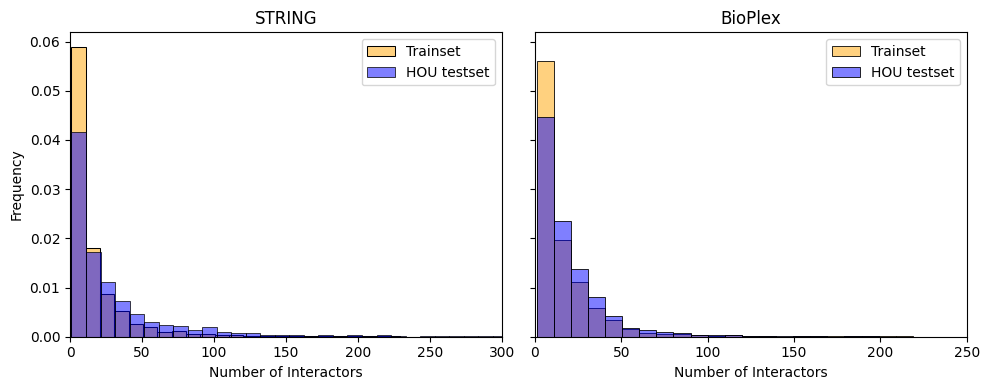

<Figure size 640x480 with 0 Axes>

In [6]:
#Histogram of the number of interactors per protein in test/train set in BioPlex/STRING databases

fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

# Plot 1: STRING
sns.histplot(all_data[all_data.datatype == "train"]['nn_string'], color='orange', label='Trainset', kde=False, stat='density', binwidth=10, alpha=0.5, ax=axes[0])
sns.histplot(all_data[all_data.datatype == "test"]['nn_string'], color='blue', label='HOU testset', kde=False, stat='density', binwidth=10, alpha=0.5, ax=axes[0])
axes[0].set_xlabel('Number of Interactors')
axes[0].set_ylabel('Frequency')
axes[0].set_title('STRING')
axes[0].legend()

# Plot 2: BioPlex
sns.histplot(all_data[all_data.datatype == "train"]['nn_bioplex'], color='orange', label='Trainset', kde=False, stat='density', binwidth=10, alpha=0.5, ax=axes[1])
sns.histplot(all_data[all_data.datatype == "test"]['nn_bioplex'], color='blue', label='HOU testset', kde=False, stat='density', binwidth=10, alpha=0.5, ax=axes[1])
axes[1].set_xlabel('Number of Interactors')
axes[1].set_title('BioPlex')
axes[1].legend()

axes[0].set_xlim(0, 300)
axes[1].set_xlim(0, 250)

# Final formatting
plt.tight_layout()
plt.show()
plt.savefig(f"{FIG_DIR}/num_interactors_histogram.pdf",  bbox_inches='tight', dpi=300)

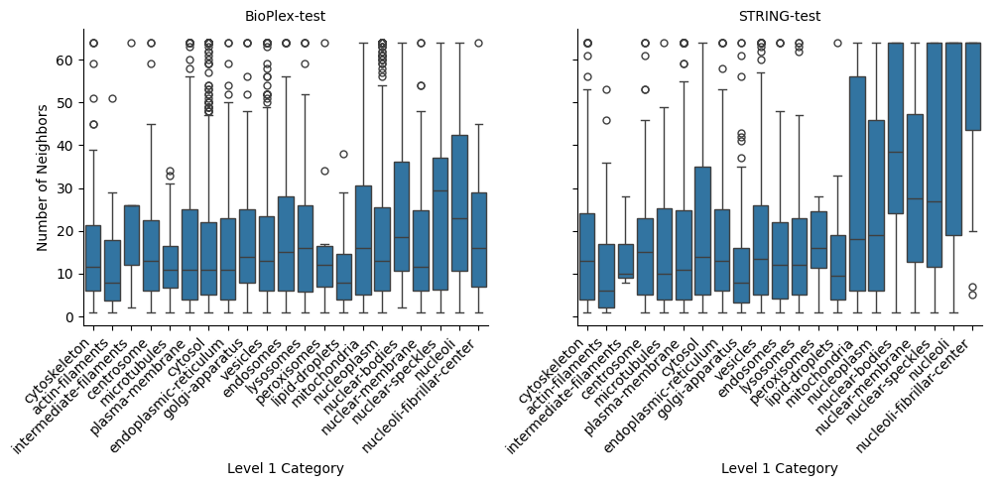

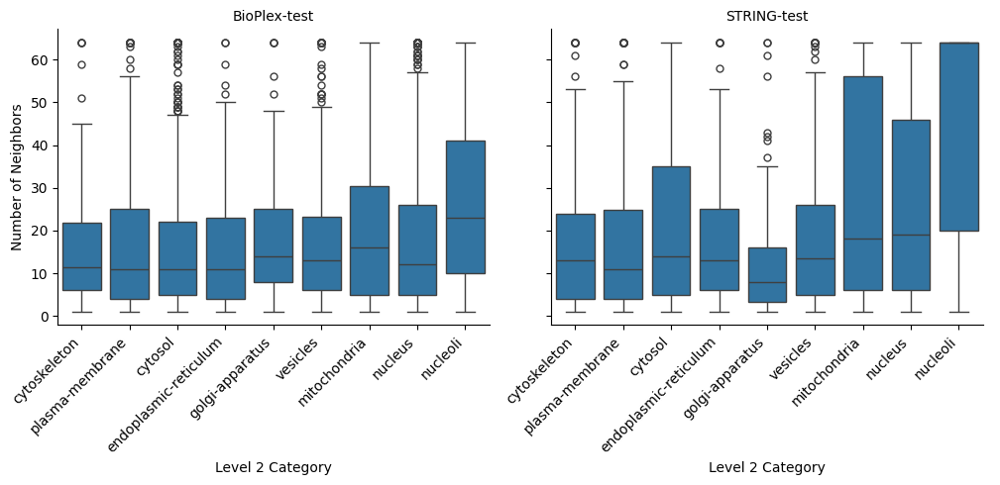

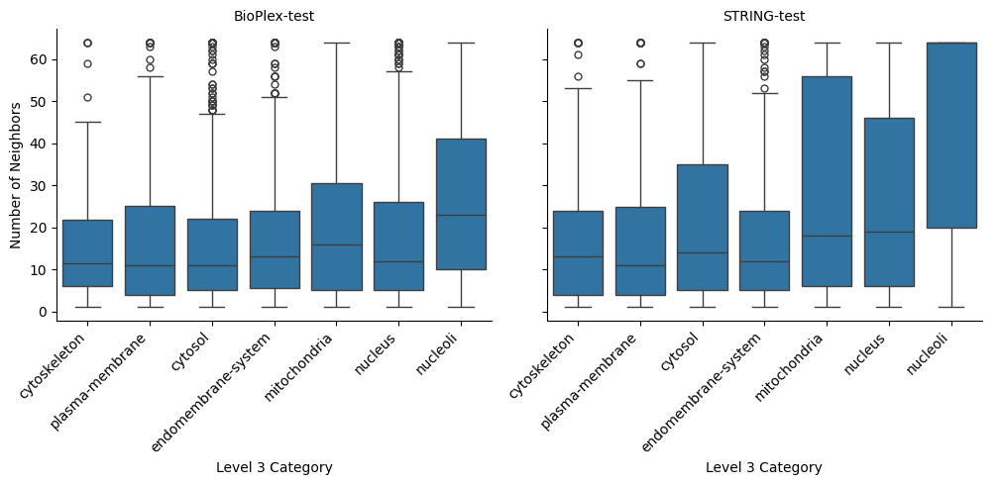

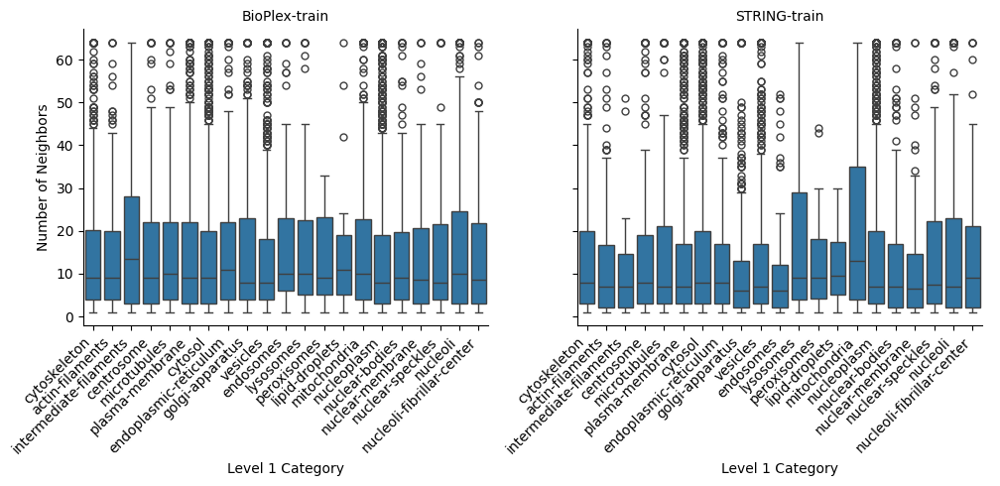

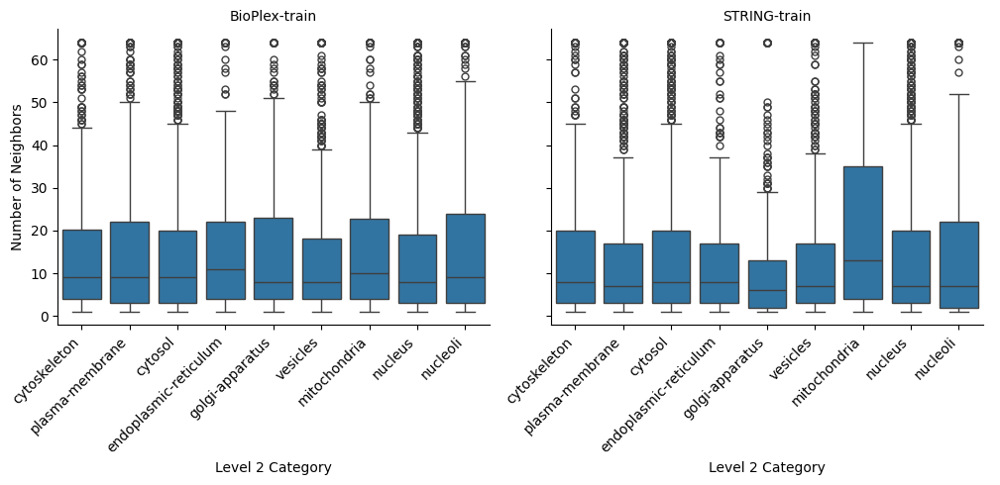

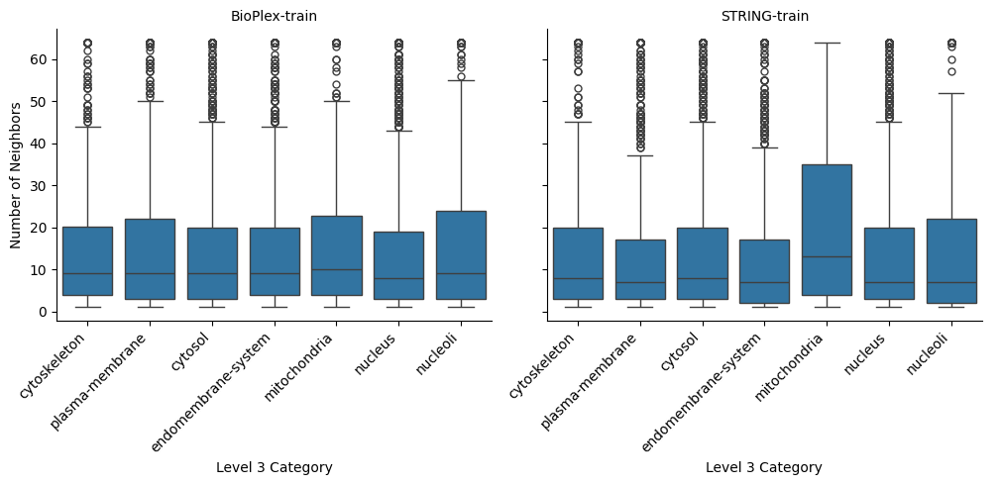

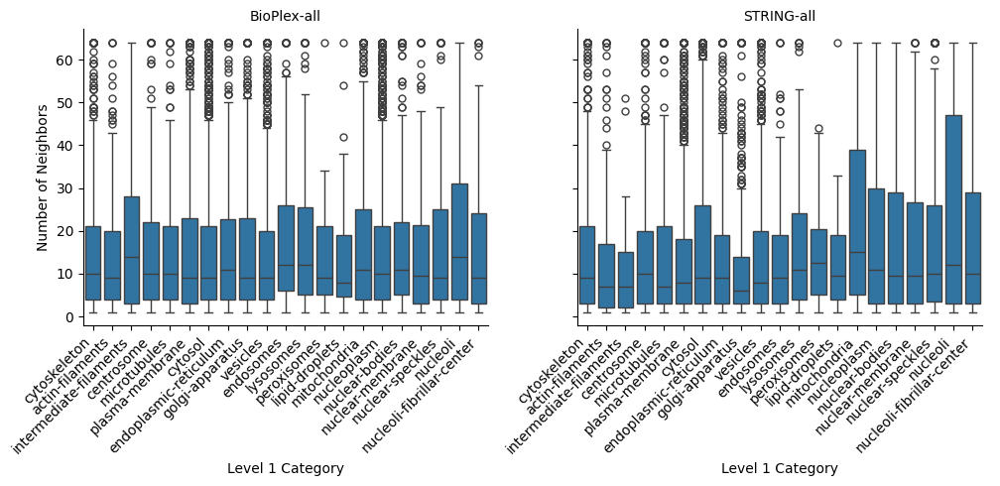

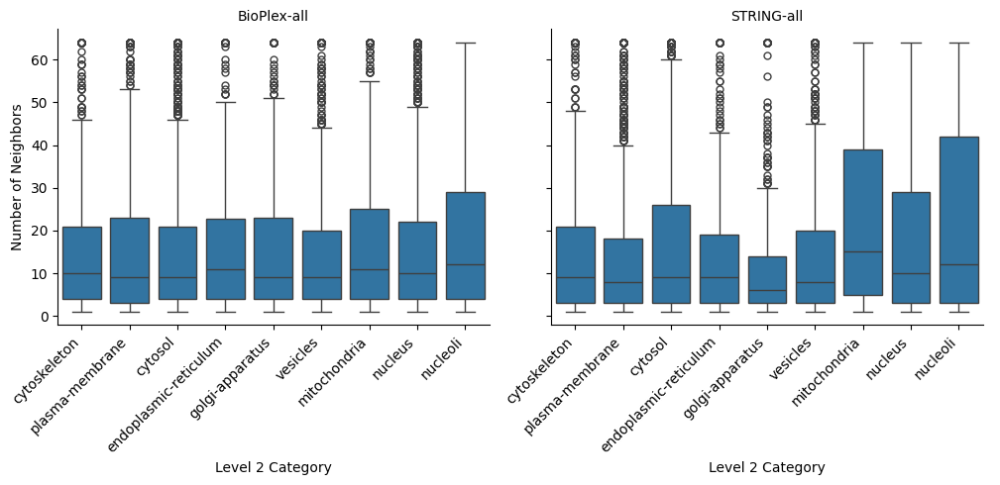

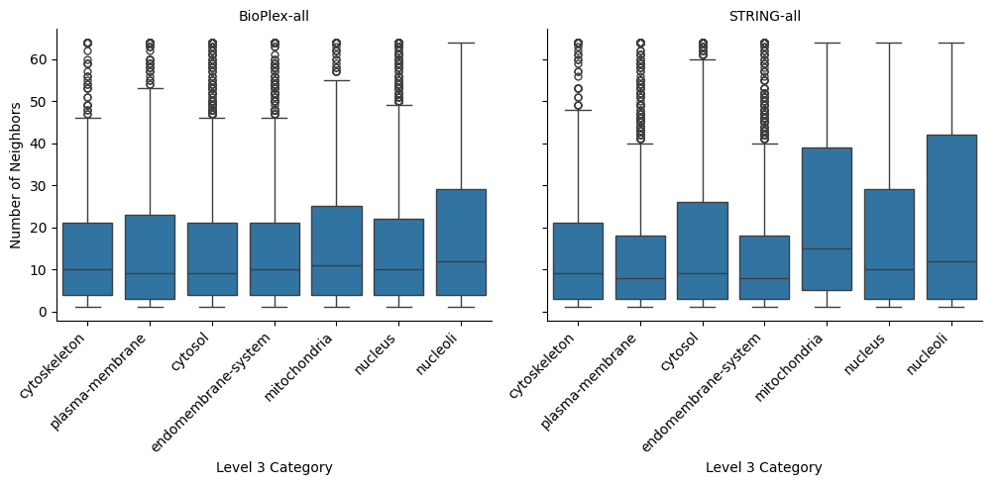

In [7]:
#Number of Neighbor across compartments
for datatype in ["test", "train", "all"]:
    for level in [1,2,3]:
        if datatype == "all":
            temp = all_data.copy()
        else:
            temp = all_data[all_data.datatype == datatype].reset_index(drop=True).copy()
        level_col = f"level{level}"
        temp = temp[["uniprot_id", level_col, "nn_bioplex", "nn_string"]]
        temp[level_col] = temp[level_col].str.split(";")
        temp_explode = temp.explode(level_col)
        temp_explode[level_col] = temp_explode[level_col].str.strip()
        temp_explode[level_col] = pd.Categorical(temp_explode[level_col], categories=orders[level-1], ordered=True)
        temp_explode.sort_values(by=level_col)


        df_long = pd.melt(
            temp_explode,
            id_vars=level_col,
            value_vars=['nn_bioplex', 'nn_string'],
            var_name='database',
            value_name='num_neighbors'
        )

        df_long['database'] = df_long['database'].map({
            'nn_bioplex': 'BioPlex',
            'nn_string': 'STRING'
        })

        g = sns.catplot(
            data=df_long,
            x=level_col,
            y=df_long['num_neighbors'].clip(lower=0, upper=64),
            col='database',
            kind='box',
            height=5,
            aspect=1,
            sharey=True,
        )

        # Format plot
        g.set_xticklabels(rotation=45, ha='right')
        g.set_axis_labels(f'Level {level} Category', 'Number of Neighbors')
        g.set_titles('{col_name}'+f"-{datatype}")
        plt.tight_layout()
        plt.savefig(f"{FIG_DIR}/num_interactors_level{level}_{datatype}.pdf",  bbox_inches='tight', dpi=300)

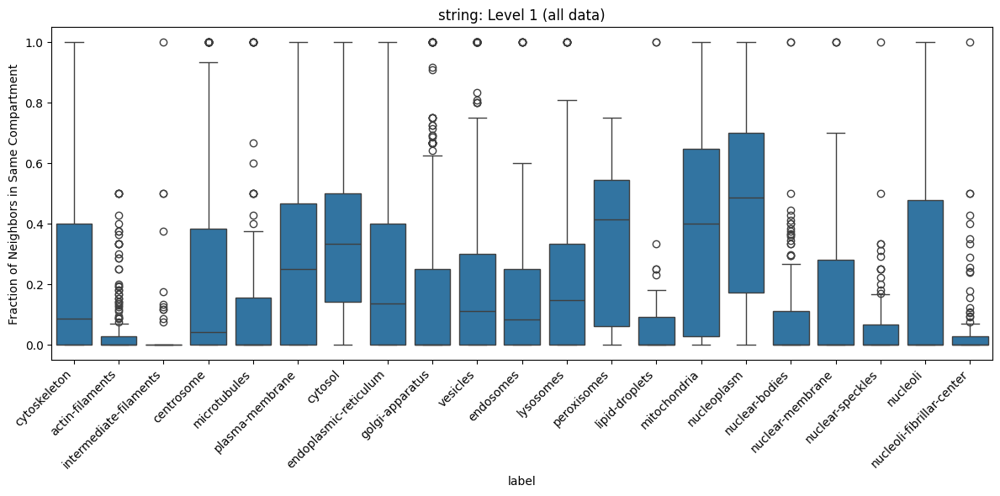

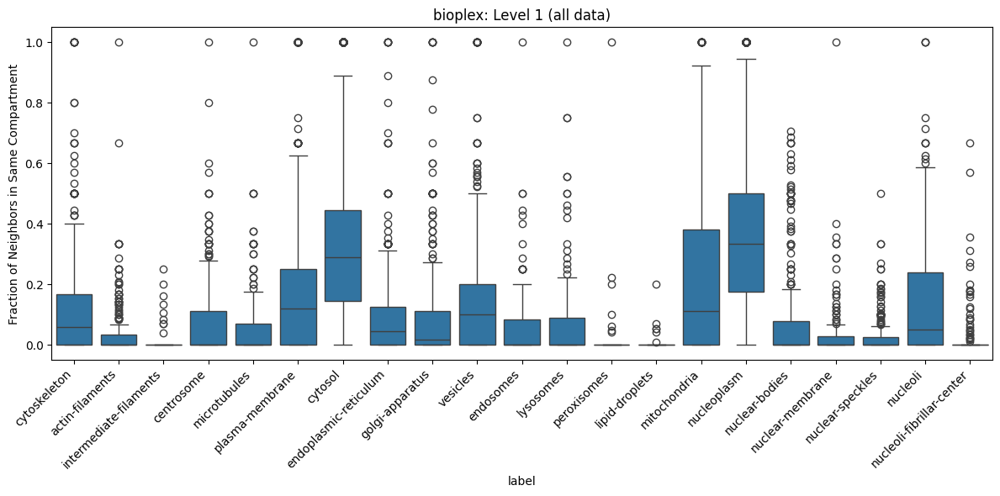

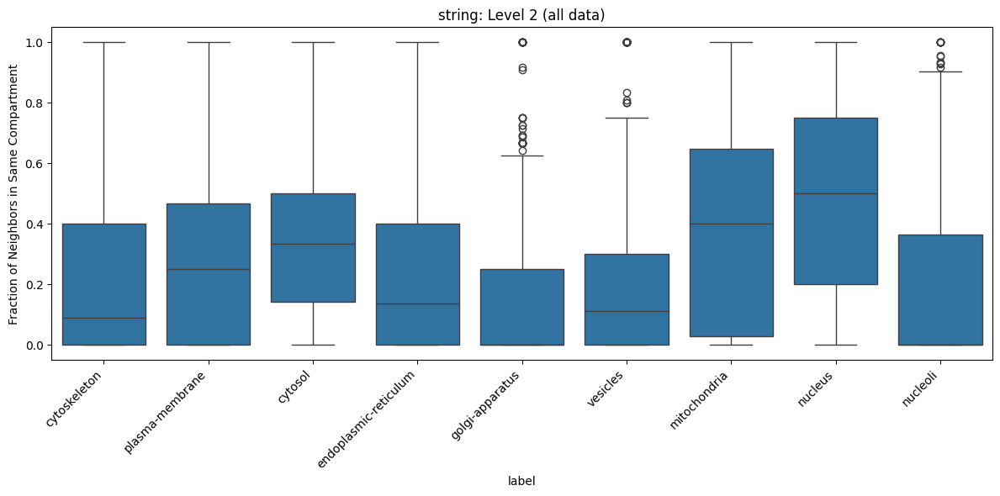

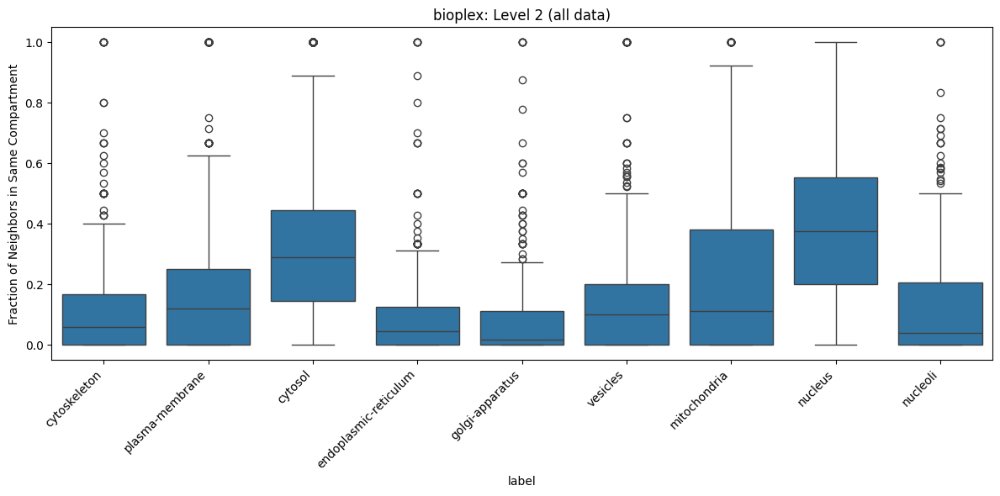

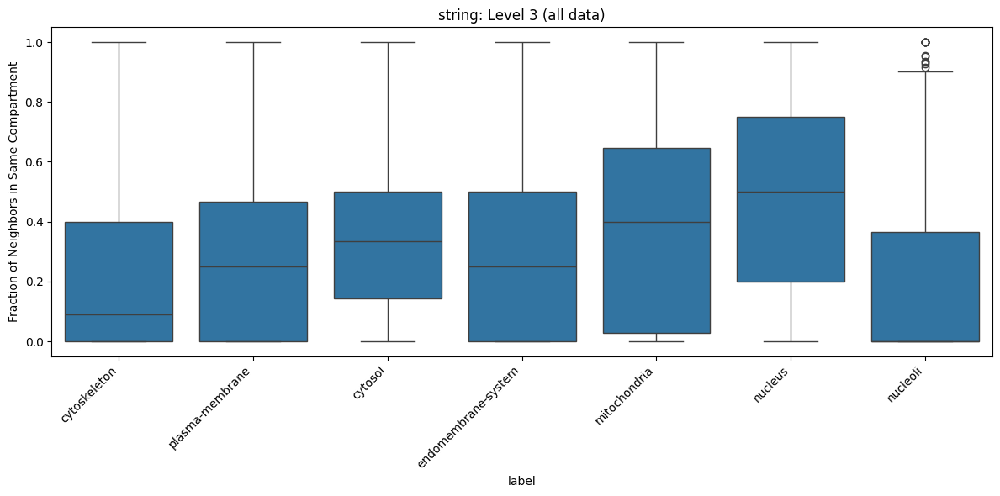

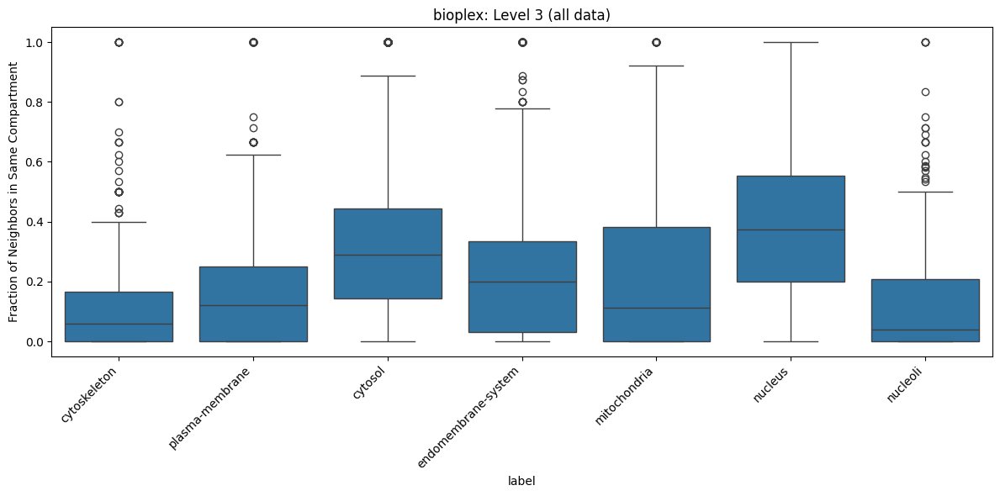

In [8]:
#Perclass box and whisker class for fraction of neighbors in the same compartment

for level in [1,2,3]:
    for database in ["string", "bioplex"]:

        # Split level1 into multiple rows (one per label)
        exploded = all_data.copy()
        exploded['label'] = exploded[f'level{level}'].str.split(';')
        exploded = exploded.explode('label')

        # Group by label (i.e., the compartment the protein localizes to)
        grouped = exploded.groupby('label')

        # For each group, compute fraction of neighbors localizing to that label
        fractions = []

        for label, group in grouped:
            nn_col = f'nn_{database}_{label}_level{level}'
            
            # Ensure the column exists
            if nn_col not in group.columns:
                continue
            
            # Compute fraction safely (if either column is NaN, result is NaN)
            fraction = group[nn_col] / group[f'nn_{database}']
            
            # Store result with corresponding label
            fractions.append(pd.DataFrame({
                'label': label,
                'fraction': fraction
            }))

        # Combine all results and make boxplot
        fraction_df = pd.concat(fractions, ignore_index=True)

        plt.figure(figsize=(12, 6))
        sns.boxplot(
            data=fraction_df, 
            x='label', 
            y='fraction', 
            order=orders[level-1])

        plt.xticks(rotation=45, ha='right')
        plt.ylabel('Fraction of Neighbors in Same Compartment')
        plt.title(f'{database}: Level {level} (all data)')
        plt.tight_layout()
        plt.savefig(f"{FIG_DIR}/frac_common_level{level}_{database}.pdf",  bbox_inches='tight', dpi=300)

/tmp/ipykernel_19271/3972282845.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data["fraction_with_label"] = plot_data["nn_with_label"] / plot_data[nn_col]
/tmp/ipykernel_19271/3972282845.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data[level_col] = pd.Categorical(plot_data[level_col], categories=orders[level-1], ordered=True)


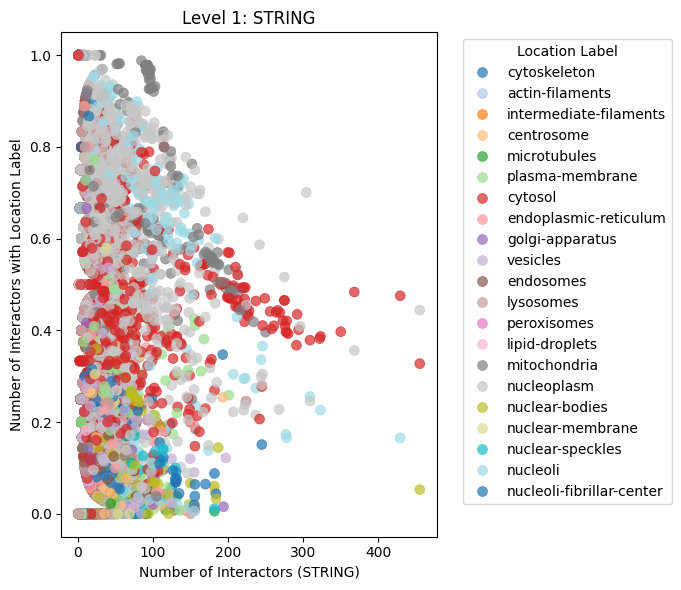

/tmp/ipykernel_19271/3972282845.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data["fraction_with_label"] = plot_data["nn_with_label"] / plot_data[nn_col]
/tmp/ipykernel_19271/3972282845.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data[level_col] = pd.Categorical(plot_data[level_col], categories=orders[level-1], ordered=True)


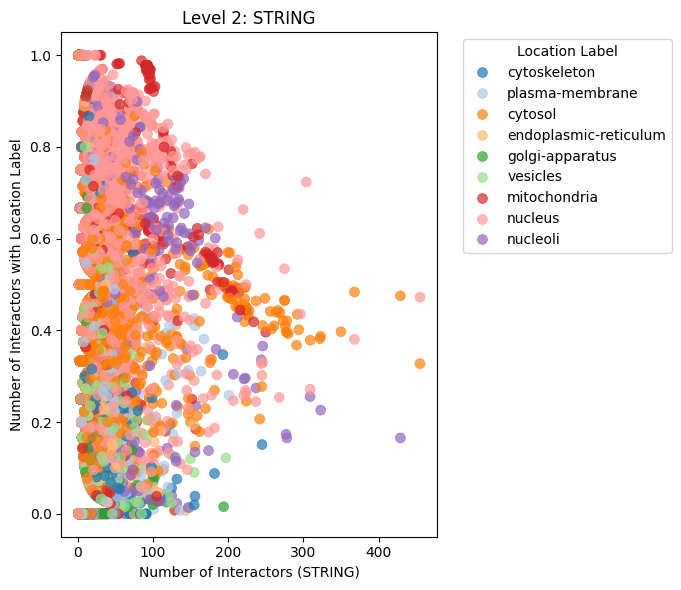

/tmp/ipykernel_19271/3972282845.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data["fraction_with_label"] = plot_data["nn_with_label"] / plot_data[nn_col]
/tmp/ipykernel_19271/3972282845.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data[level_col] = pd.Categorical(plot_data[level_col], categories=orders[level-1], ordered=True)


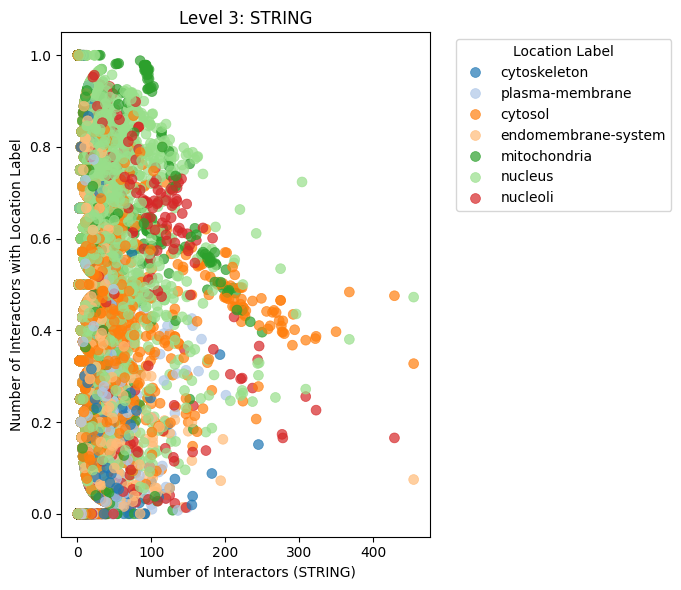

In [9]:
for level in [1, 2, 3]:
    level_col = f"level{level}"
    nn_col = "nn_string"

    nn_label_cols = [col for col in all_data.columns if col.startswith("nn_string_") and col.endswith(f"_level{level}")]
    temp = all_data[[nn_col, level_col] + nn_label_cols].copy()

    temp[level_col] = temp[level_col].str.split(";")
    temp_exploded = temp.explode(level_col)
    temp_exploded[level_col] = temp_exploded[level_col].str.lower().str.strip()

    nn_values = []
    for idx, row in temp_exploded.iterrows():
        label = row[level_col].replace(" ", "_") if pd.notna(row[level_col]) else None
        nn_col_name = f"nn_string_{label}_level{level}" if label else None
        if nn_col_name and nn_col_name in temp_exploded.columns:
            nn_val = row[nn_col_name]
        else:
            nn_val = pd.NA
        nn_values.append(nn_val)

    temp_exploded["nn_with_label"] = nn_values
    plot_data = temp_exploded.dropna(subset=[nn_col, "nn_with_label", level_col])
    plot_data["fraction_with_label"] = plot_data["nn_with_label"] / plot_data[nn_col]
    plot_data[level_col] = pd.Categorical(plot_data[level_col], categories=orders[level-1], ordered=True)


    plt.figure(figsize=(7, 6))
    sns.scatterplot(
        data=plot_data,
        x=nn_col,
        y="fraction_with_label",
        hue=level_col,
        palette="tab20",
        alpha=0.7,
        s=50,
        edgecolor=None
    )

    plt.title(f"Level {level}: STRING")
    plt.xlabel("Number of Interactors (STRING)")
    plt.ylabel("Number of Interactors with Location Label")
    plt.legend(title="Location Label", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

In [10]:
#COLLECT METRICS FOR OVERALL PERFORMANE 

overall = pd.read_csv(f"{PPI_ANALYSIS_DIR}/overall_metrics.csv")
overall["inference_neighbour_config"] = overall['Inference PPI'].map({"Test Set": "test_ppi", "Training Set": "train_ppi", "No PPI": "no_ppi", "All PPI": "all_ppi"})
overall = overall[overall.ppi_test==False] #IDK what this is but ankit says to do it...
overall = overall[['inference_neighbour_config',
       'exp_name', 'category_level',
       'num_neighbors', 'ppi_database', 'run_id']].sort_values(["exp_name", "category_level", 'num_neighbors', 'ppi_database']).reset_index(drop=True)

dfs = []
for i, row in overall.iterrows():
       path = f"{PPI_EXP_DIR}/{row.exp_name}_hpa_uniprot_combined_trainset_{row.run_id}/inference_{row.inference_neighbour_config}_all_folds_overall_metrics.csv"
       df = pd.read_csv(path)
       dfs.append(df)

results = pd.concat(dfs).reset_index(drop=True)
overall = pd.concat([overall, results], axis=1)

overall = overall[overall.exp_name == "ProtT5"]
overall_level1 = overall[overall.category_level == "level1"].reset_index(drop=True)
overall_level2 = overall[overall.category_level == "level2"].reset_index(drop=True)
overall_level3 = overall[overall.category_level == "level3"].reset_index(drop=True)

In [11]:
#COLLECT METRICS ABOUT PERCLASS PERFORMANCE

best_run = overall_level1.iloc[overall_level1.macro_ap.idxmax()].run_id
best_models = overall_level1[overall_level1.run_id == best_run]
row = best_models.iloc[0]
dfs = []
for i, row in best_models.iterrows():
    path = f"{PPI_EXP_DIR}/{row.exp_name}_hpa_uniprot_combined_trainset_{row.run_id}/inference_{row.inference_neighbour_config}_all_folds_perclass_metrics.csv"
    df = pd.read_csv(path)
    df["inference_neighbour_config"] = row.inference_neighbour_config
    dfs.append(df)
bestmodel_perclass_level1 = pd.concat(dfs)

dfs = []
for i, row in overall_level2.iterrows():
    path = f"{PPI_EXP_DIR}/{row.exp_name}_hpa_uniprot_combined_trainset_{row.run_id}/inference_{row.inference_neighbour_config}_all_folds_perclass_metrics.csv"
    df = pd.read_csv(path)
    df["inference_neighbour_config"] = row.inference_neighbour_config
    dfs.append(df)
bestmodel_perclass_level2 = pd.concat(dfs)

dfs = []
for i, row in overall_level3.iterrows():
    path = f"{PPI_EXP_DIR}/{row.exp_name}_hpa_uniprot_combined_trainset_{row.run_id}/inference_{row.inference_neighbour_config}_all_folds_perclass_metrics.csv"
    df = pd.read_csv(path)
    df["inference_neighbour_config"] = row.inference_neighbour_config
    dfs.append(df)
bestmodel_perclass_level3 = pd.concat(dfs)

In [12]:
#DISPLAY METRIC TABLES
df = overall.drop(["exp_name", "run_id"], axis=1)
#df = overall
df = df.set_index(['category_level', 'num_neighbors', 'inference_neighbour_config']).round(3)
display(df)
df.to_csv(f"{FIG_DIR}/avg_metrics.csv")

pd.set_option('display.max_rows', None)   # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns

print("Level 1")
df = bestmodel_perclass_level1.pivot(index='category', columns='inference_neighbour_config')
df.columns = df.columns.swaplevel(0, 1)
df = df.sort_index(axis=1, level=0).round(3)
display(df)
df.to_csv(f"{FIG_DIR}/perclass_metrics_level1.csv")

print("Level 2")
df = bestmodel_perclass_level2.pivot(index='category', columns='inference_neighbour_config')
df.columns = df.columns.swaplevel(0, 1)
df = df.sort_index(axis=1, level=0).round(3)
display(df)
df.to_csv(f"{FIG_DIR}/perclass_metrics_level2.csv")

df = bestmodel_perclass_level3.pivot(index='category', columns='inference_neighbour_config')
df.columns = df.columns.swaplevel(0, 1)
df = df.sort_index(axis=1, level=0).round(3)
print("Level 3")
display(df)
df.to_csv(f"{FIG_DIR}/perclass_metrics_level3.csv")

ppi_database  \
category_level num_neighbors inference_neighbour_config                
level1         8             train_ppi                       bioplex   
                             test_ppi                        bioplex   
                             no_ppi                          bioplex   
                             all_ppi                         bioplex   
                             train_ppi                        string   
                             test_ppi                         string   
                             no_ppi                           string   
                             all_ppi                          string   
               16            train_ppi                       bioplex   
                             test_ppi                        bioplex   
                             no_ppi                          bioplex   
                             all_ppi                         bioplex   
                             train_ppi                        string   
                             test_ppi                         string   
                             no_ppi                           string   
                             all_ppi                          string   
               32            train_ppi                       bioplex   
                             test_ppi                        bioplex   
                             no_ppi                          bioplex   
                             all_ppi                         bioplex   
                             train_ppi                        string   
                             test_ppi                         string   
                             no_ppi                           string   
                             all_ppi                          string   
               64            train_ppi                       bioplex   
                             test_ppi                        bioplex   
                             no_ppi                          bioplex   
                             all_ppi                         bioplex   
                             train_ppi                        string   
                             test_ppi                         string   
                             no_ppi                           string   
                             all_ppi                          string   
level2         64            train_ppi                        string   
                             test_ppi                         string   
                             no_ppi                           string   
                             all_ppi                          string   
level3         64            train_ppi                        string   
                             test_ppi                         string   
                             no_ppi                           string   
                             all_ppi                          string   

                                                         macro_ap  micro_ap  \
category_level num_neighbors inference_neighbour_config                       
level1         8             train_ppi                      0.396     0.648   
                             test_ppi                       0.398     0.651   
                             no_ppi                         0.424     0.676   
                             all_ppi                        0.395     0.648   
                             train_ppi                      0.425     0.669   
                             test_ppi                       0.426     0.669   
                             no_ppi                         0.428     0.674   
                             all_ppi                        0.427     0.670   
               16            train_ppi                      0.390     0.648   
                             test_ppi                       0.394     0.652   
                             no_ppi                         0.422     0.675   
    

Level 1


inference_neighbour_config all_ppi                                          \
                               acc   count     f1 jaccard    mcc precision   
category                                                                     
actin-filaments              0.990    29.0  0.302   0.178  0.298     0.333   
centrosome                   0.958   125.0  0.375   0.231  0.353     0.366   
cytoskeleton                 0.926   192.0  0.424   0.269  0.397     0.348   
cytosol                      0.731  1291.0  0.665   0.498  0.465     0.575   
endoplasmic-reticulum        0.970   166.0  0.676   0.511  0.662     0.630   
endosomes                    0.962   117.0  0.198   0.110  0.188     0.277   
golgi-apparatus              0.967   145.0  0.349   0.211  0.387     0.680   
intermediate-filaments       0.998     6.0  0.000   0.000 -0.001     0.000   
lipid-droplets               0.995    24.0  0.333   0.200  0.415     0.833   
lysosomes                    0.967   119.0  0.181   0.099  0.201     0.389   
microtubules                 0.967    39.0  0.138   0.074  0.141     0.094   
mitochondria                 0.977   335.0  0.866   0.764  0.854     0.895   
nuclear-bodies               0.802    86.0  0.083   0.043  0.078     0.046   
nuclear-membrane             0.991    48.0  0.444   0.286  0.519     0.933   
nuclear-speckles             0.987    33.0  0.306   0.180  0.300     0.282   
nucleoli                     0.970   170.0  0.553   0.382  0.571     0.816   
nucleoli-fibrillar-center    0.763    22.0  0.011   0.006 -0.001     0.006   
nucleoplasm                  0.809  1618.0  0.762   0.616  0.605     0.806   
peroxisomes                  0.998    11.0  0.471   0.308  0.491     0.667   
plasma-membrane              0.926   407.0  0.676   0.510  0.636     0.637   
vesicles                     0.864   382.0  0.422   0.267  0.352     0.368   

inference_neighbour_config               no_ppi                                \
                           recall rocauc    acc   count     f1 jaccard    mcc   
category                                                                        
actin-filaments             0.276  0.929  0.989    29.0  0.344   0.208  0.340   
centrosome                  0.384  0.878  0.943   125.0  0.365   0.223  0.351   
cytoskeleton                0.542  0.894  0.928   192.0  0.441   0.283  0.416   
cytosol                     0.787  0.808  0.746  1291.0  0.684   0.520  0.498   
endoplasmic-reticulum       0.729  0.952  0.971   166.0  0.654   0.486  0.639   
endosomes                   0.154  0.875  0.956   117.0  0.217   0.122  0.196   
golgi-apparatus             0.234  0.896  0.967   145.0  0.302   0.178  0.375   
intermediate-filaments      0.000  0.793  0.998     6.0  0.000   0.000 -0.001   
lipid-droplets              0.208  0.963  0.995    24.0  0.333   0.200  0.415   
lysosomes                   0.118  0.907  0.969   119.0  0.298   0.175  0.314   
microtubules                0.256  0.882  0.971    39.0  0.164   0.089  0.168   
mitochondria                0.839  0.967  0.977   335.0  0.864   0.761  0.854   
nuclear-bodies              0.395  0.645  0.758    86.0  0.074   0.039  0.068   
nuclear-membrane            0.292  0.861  0.992    48.0  0.529   0.360  0.578   
nuclear-speckles            0.333  0.837  0.989    33.0  0.189   0.104  0.189   
nucleoli                    0.418  0.925  0.971   170.0  0.587   0.416  0.596   
nucleoli-fibrillar-center   0.227  0.479  0.636    22.0  0.009   0.004 -0.014   
nucleoplasm                 0.723  0.875  0.829  1618.0  0.783   0.643  0.648   
peroxisomes                 0.364  0.989  0.998    11.0  0.556   0.385  0.569   
plasma-membrane             0.720  0.925  0.930   407.0  0.679   0.515  0.640   
vesicles                    0.495  0.809  0.892   382.0  0.462   0.300  0.401   

inference_neighbour_config                         test_ppi                 \
                           precision recall rocauc      acc   count     f1   
category                  

Level 2


inference_neighbour_config all_ppi                                          \
                               acc   count     f1 jaccard    mcc precision   
category                                                                     
cytoskeleton                 0.940   195.0  0.416   0.263  0.385     0.418   
cytosol                      0.721  1291.0  0.671   0.504  0.473     0.558   
endoplasmic-reticulum        0.972   166.0  0.673   0.507  0.658     0.677   
golgi-apparatus              0.963   145.0  0.390   0.242  0.385     0.523   
mitochondria                 0.977   335.0  0.866   0.764  0.854     0.895   
nucleoli                     0.964   196.0  0.496   0.330  0.544     0.905   
nucleus                      0.820  1709.0  0.786   0.648  0.635     0.839   
plasma-membrane              0.921   407.0  0.664   0.497  0.623     0.610   
vesicles                     0.859   384.0  0.424   0.269  0.354     0.361   

inference_neighbour_config               no_ppi                                \
                           recall rocauc    acc   count     f1 jaccard    mcc   
category                                                                        
cytoskeleton                0.415  0.891  0.944   195.0  0.401   0.251  0.373   
cytosol                     0.840  0.810  0.750  1291.0  0.695   0.533  0.516   
endoplasmic-reticulum       0.669  0.960  0.972   166.0  0.660   0.493  0.646   
golgi-apparatus             0.310  0.900  0.967   145.0  0.308   0.182  0.372   
mitochondria                0.839  0.971  0.977   335.0  0.859   0.754  0.849   
nucleoli                    0.342  0.906  0.967   196.0  0.561   0.389  0.587   
nucleus                     0.740  0.892  0.821  1709.0  0.775   0.633  0.645   
plasma-membrane             0.727  0.931  0.931   407.0  0.686   0.523  0.648   
vesicles                    0.516  0.828  0.839   384.0  0.438   0.280  0.376   

inference_neighbour_config                         test_ppi                 \
                           precision recall rocauc      acc   count     f1   
category                                                                     
cytoskeleton                   0.439  0.369  0.912    0.937   195.0  0.416   
cytosol                        0.591  0.844  0.831    0.734  1291.0  0.678   
endoplasmic-reticulum          0.691  0.633  0.962    0.970   166.0  0.644   
golgi-apparatus                0.757  0.193  0.898    0.964   145.0  0.396   
mitochondria                   0.924  0.803  0.970    0.978   335.0  0.868   
nucleoli                       0.871  0.413  0.900    0.965   196.0  0.542   
nucleus                        0.887  0.689  0.901    0.821  1709.0  0.786   
plasma-membrane                0.664  0.710  0.935    0.923   407.0  0.667   
vesicles                       0.338  0.622  0.840    0.847   384.0  0.432   

inference_neighbour_config                                        train_ppi  \
                           jaccard    mcc precision recall rocauc       acc   
category                                                                      
cytoskeleton                 0.262  0.383     0.397  0.436  0.896     0.940   
cytosol                      0.513  0.487     0.574  0.829  0.811     0.701   
endoplasmic-reticulum        0.475  0.628     0.656  0.633  0.961     0.971   
golgi-apparatus              0.247  0.396     0.549  0.310  0.899     0.963   
mitochondria                 0.766  0.857     0.906  0.833  0.972     0.978   
nucleoli                     0.372  0.559     0.808  0.408  0.906     0.963   
nucleus                      0.648  0.638     0.844  0.736  0.893     0.820   
plasma-membrane              0.501  0.627     0.618  0.725  0.933     0.927   
vesicles                     0.276  0.366     0.345  0.578  0.830     0.866   

inference_neighbour_config                                                 \
                             count     f1 jaccard    mcc precision recall   
category                                          

Level 3


inference_neighbour_config all_ppi                                          \
                               acc   count     f1 jaccard    mcc precision   
category                                                                     
cytoskeleton                 0.946   195.0  0.393   0.245  0.369     0.459   
cytosol                      0.756  1291.0  0.695   0.533  0.517     0.602   
endomembrane-system          0.887   669.0  0.621   0.450  0.569     0.752   
mitochondria                 0.979   335.0  0.873   0.774  0.862     0.909   
nucleoli                     0.967   196.0  0.577   0.406  0.594     0.843   
nucleus                      0.831  1709.0  0.799   0.665  0.659     0.856   
plasma-membrane              0.929   407.0  0.645   0.476  0.608     0.697   

inference_neighbour_config               no_ppi                                \
                           recall rocauc    acc   count     f1 jaccard    mcc   
category                                                                        
cytoskeleton                0.344  0.901  0.939   195.0  0.417   0.263  0.385   
cytosol                     0.823  0.823  0.767  1291.0  0.703   0.543  0.531   
endomembrane-system         0.529  0.886  0.889   669.0  0.625   0.454  0.576   
mitochondria                0.839  0.970  0.978   335.0  0.868   0.767  0.857   
nucleoli                    0.439  0.918  0.966   196.0  0.531   0.361  0.575   
nucleus                     0.750  0.903  0.829  1709.0  0.789   0.651  0.659   
plasma-membrane             0.600  0.930  0.935   407.0  0.661   0.494  0.631   

inference_neighbour_config                         test_ppi                 \
                           precision recall rocauc      acc   count     f1   
category                                                                     
cytoskeleton                   0.409  0.426  0.910    0.946   195.0  0.394   
cytosol                        0.618  0.816  0.827    0.759  1291.0  0.697   
endomembrane-system            0.766  0.528  0.888    0.887   669.0  0.624   
mitochondria                   0.917  0.824  0.970    0.978   335.0  0.871   
nucleoli                       0.924  0.372  0.916    0.967   196.0  0.587   
nucleus                        0.886  0.711  0.904    0.833  1709.0  0.801   
plasma-membrane                0.748  0.592  0.932    0.931   407.0  0.641   

inference_neighbour_config                                        train_ppi  \
                           jaccard    mcc precision recall rocauc       acc   
category                                                                      
cytoskeleton                 0.245  0.371     0.462  0.344  0.902     0.945   
cytosol                      0.535  0.520     0.607  0.819  0.824     0.753   
endomembrane-system          0.453  0.570     0.747  0.535  0.887     0.888   
mitochondria                 0.771  0.860     0.909  0.836  0.971     0.978   
nucleoli                     0.416  0.600     0.832  0.454  0.919     0.965   
nucleus                      0.668  0.663     0.861  0.749  0.904     0.829   
plasma-membrane              0.472  0.608     0.717  0.580  0.931     0.932   

inference_neighbour_config                                                 \
                             count     f1 jaccard    mcc precision recall   
category                                                                    
cytoskeleton                 195.0  0.385   0.238  0.361     0.455  0.333   
cytosol                     1291.0  0.695   0.532  0.516     0.597  0.830   
endomembrane-system          669.0  0.623   0.452  0.571     0.756  0.529   
mitochondria                 335.0  0.869   0.769  0.858     0.909  0.833   
nucleoli                     196.0  0.560   0.389  0.574     0.808  0.429   
nucleus                     1709.0  0.793   0.657  0.655     0.864  0.733   
plasma-membrane              407.0  0.656   0.488  0.620     0.707  0.612   

inference_neighbour_config         
                           ro

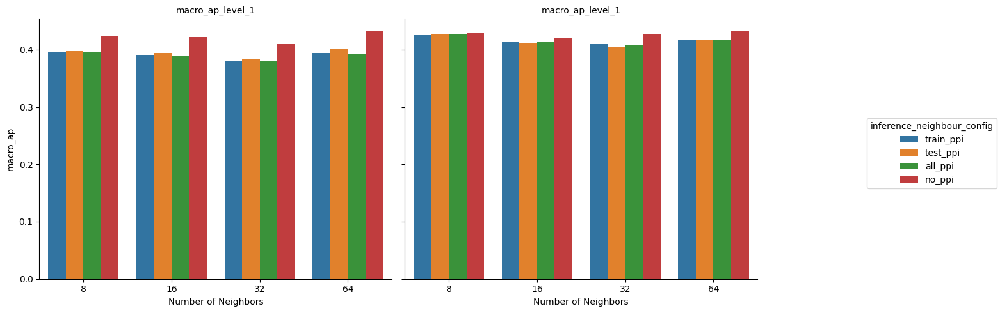

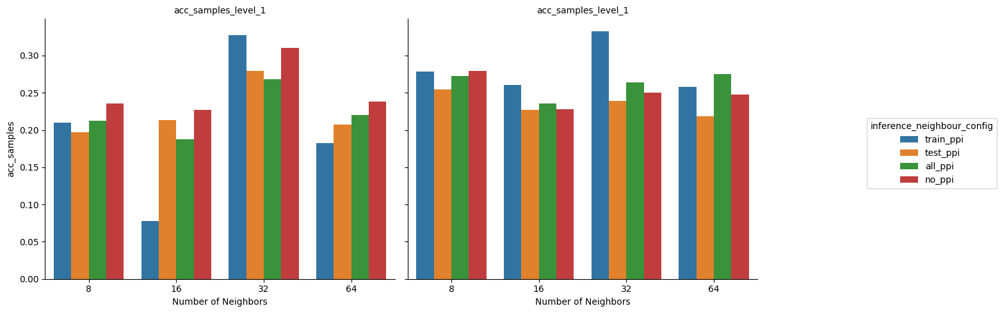

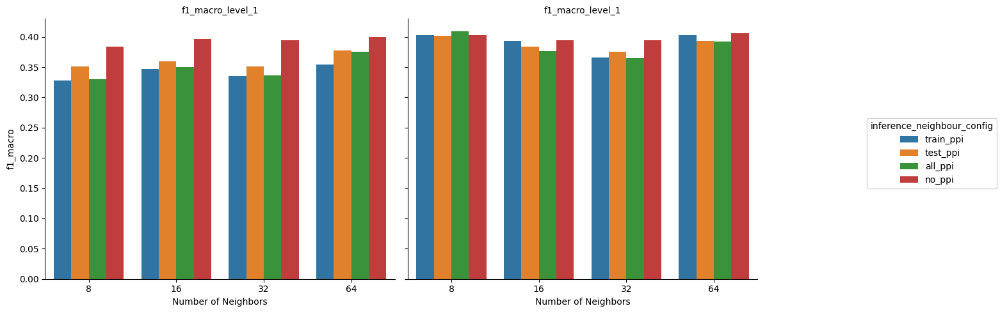

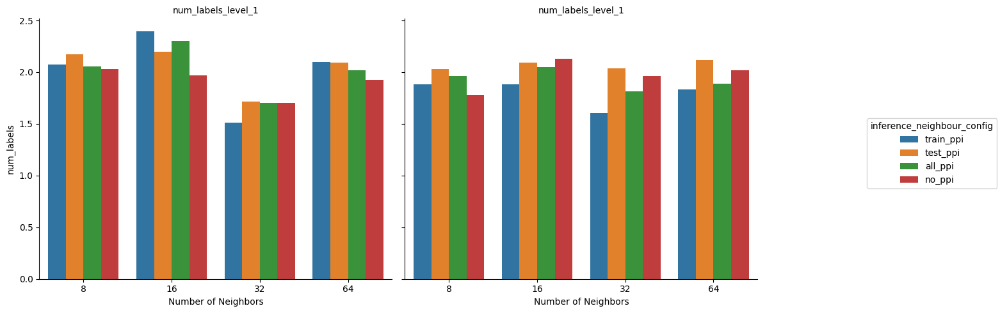

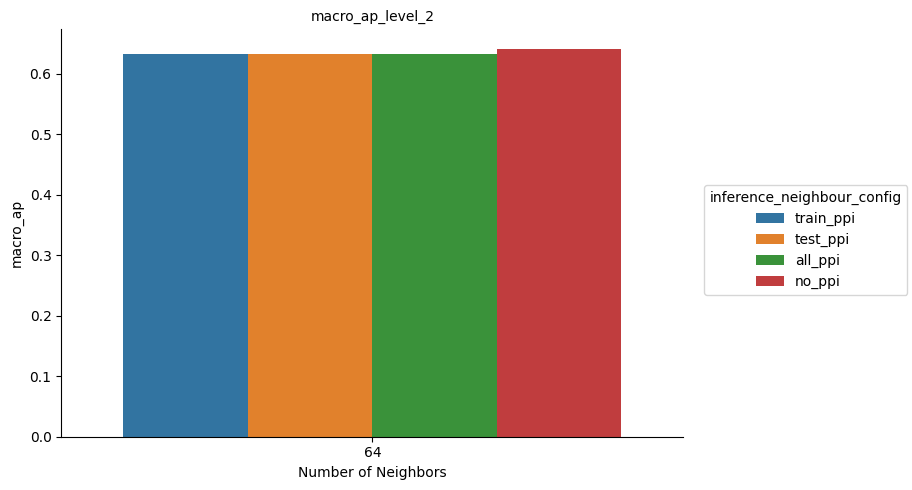

...

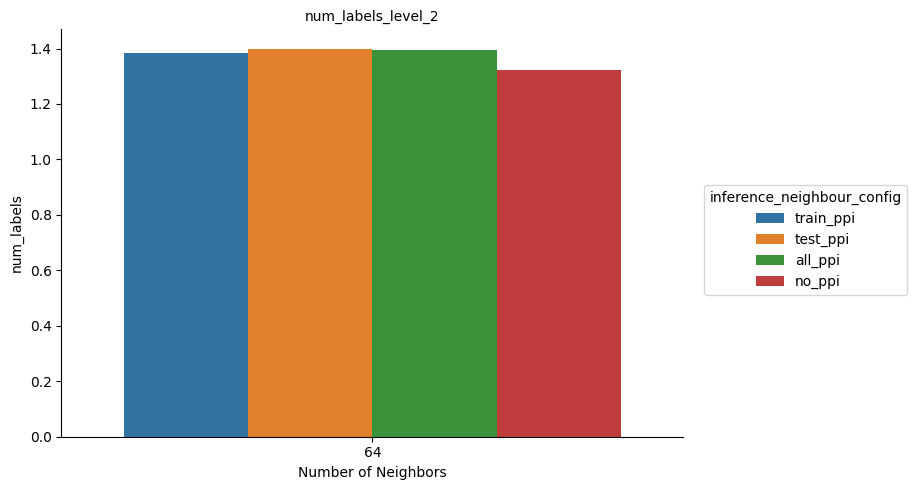

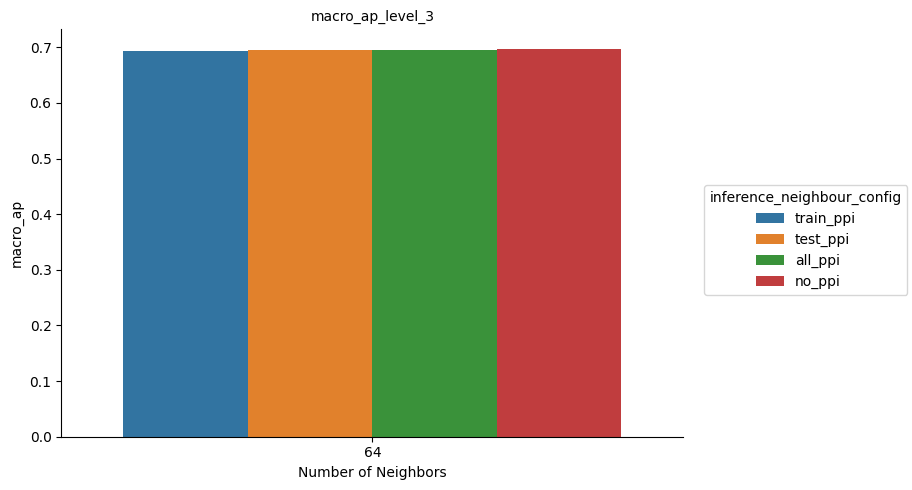

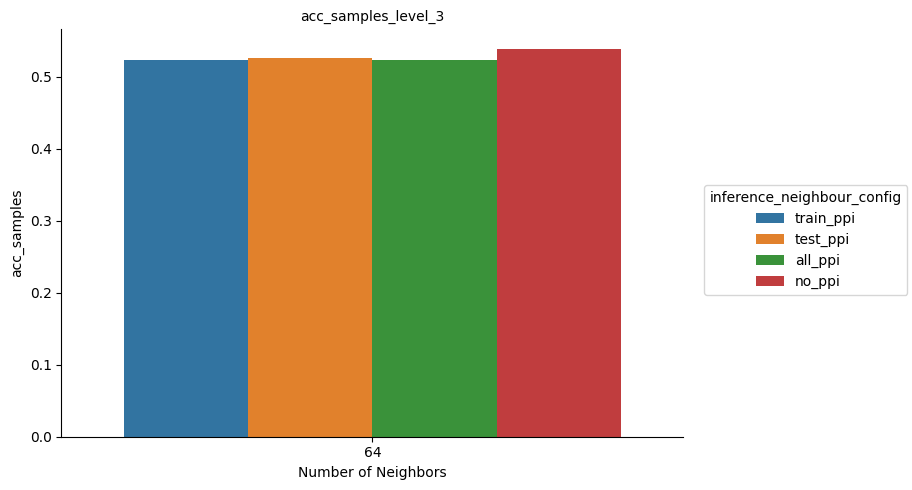

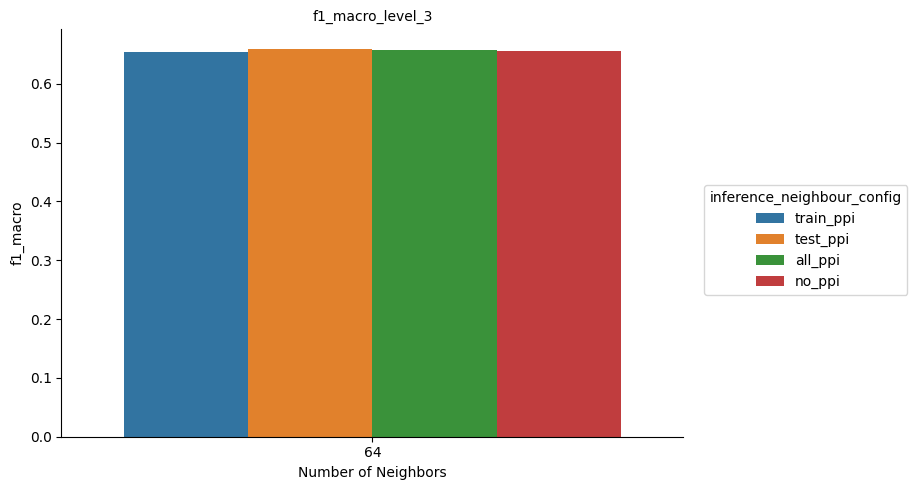

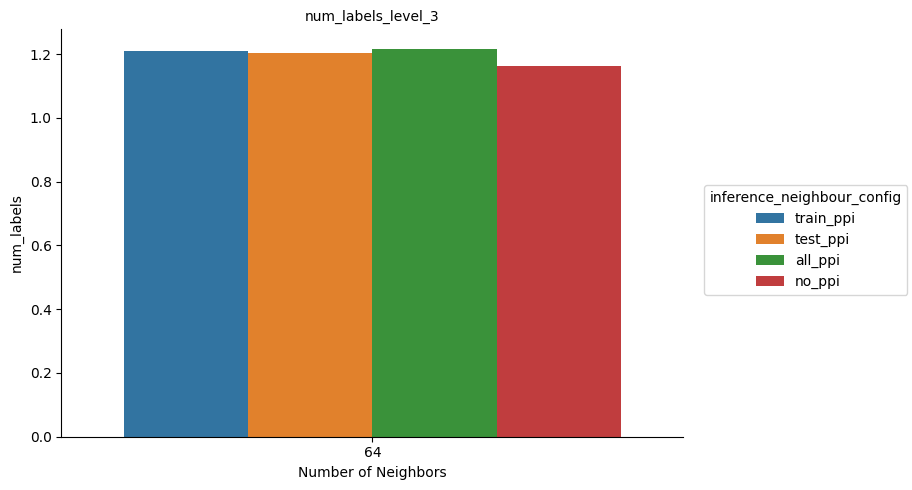

In [13]:
# Create the bar plot

hue_order = ['train_ppi', 'test_ppi', 'all_ppi', 'no_ppi']

metrics = ['macro_ap', 'acc_samples', 'f1_macro', 'num_labels']

overall_dfs = [overall_level1, overall_level2, overall_level3]
for level in [1,2,3]:
    overall_df = overall_dfs[level-1]

    for metric in metrics:
        g = sns.catplot(
            data=overall_df,
            x='num_neighbors',
            y=metric,
            hue='inference_neighbour_config',
            hue_order=hue_order,
            col='ppi_database',
            kind='bar',
            height=5,
            aspect=1
        )

        # Adjust the plot
        g.set_axis_labels("Number of Neighbors", metric)
        g.set_titles(f"{metric}_level_{level}")

        g._legend.set_bbox_to_anchor((1.3, 0.5))  # (x, y) position
        g._legend.set_frame_on(True)               # Optional: add border around legend

        plt.tight_layout()
        plt.savefig(f"{FIG_DIR}/ppi_overall_barplot_{metric}_level{level}.pdf",  bbox_inches='tight', dpi=300)

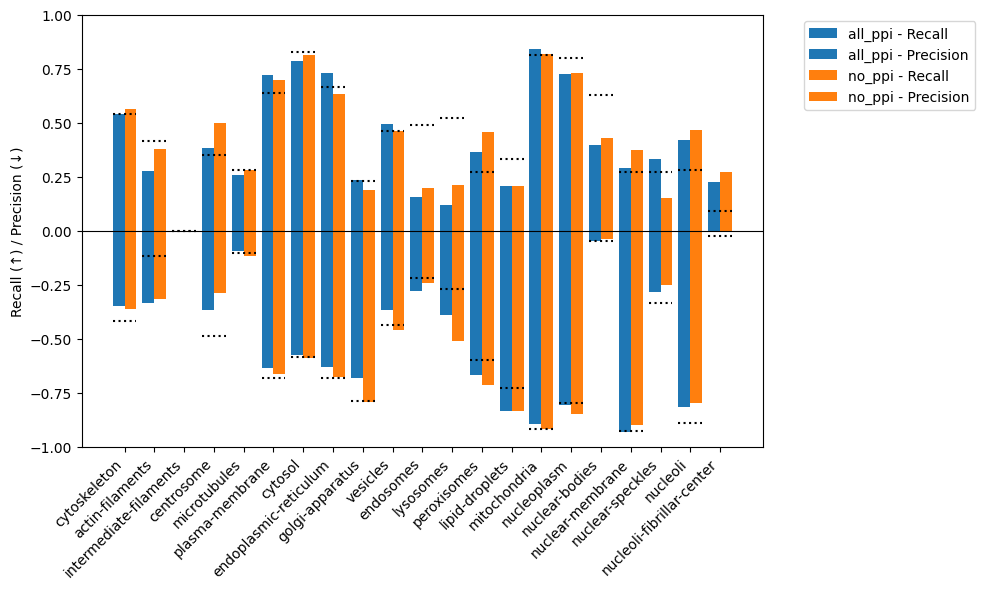

In [14]:
#PRECISION RECALL bar plot for LEVEL1 compared to ProT5-MHA
prott5_perclass_metrics = pd.read_csv(f"{PATH_TO_BEST_MODEL}/all_folds_perclass_metrics.csv")
prott5_perclass_metrics = prott5_perclass_metrics.set_index("category")
prott5_mha_precision = prott5_perclass_metrics.precision.to_dict()
prott5_mha_recall = prott5_perclass_metrics.recall.to_dict()


# Prepare data
#configs = ['train_ppi', 'test_ppi', 'all_ppi', 'no_ppi']
configs = ['all_ppi', 'no_ppi']
categories = bestmodel_perclass_level1['category'].unique()

# Parameters
n_configs = len(configs)
bar_width = 0.8 / n_configs  # Divide group space evenly
x = np.arange(len(categories))  # Base x for each category

# Color map for configs
colors = plt.cm.tab10.colors  # Or pick your own list of colors


# Create plot
fig, ax = plt.subplots(figsize=(10, 6))

# Loop over configs and plot recall and precision
for i, config in enumerate(configs):
    # Filter data
    sub_df = bestmodel_perclass_level1[bestmodel_perclass_level1['inference_neighbour_config'] == config]
    sub_df = sub_df.set_index('category').reindex(categories)  # Ensure order

    # X positions offset by config index
    x_offset = x + (i - n_configs / 2) * bar_width + bar_width / 2

    # Plot recall
    ax.bar(x_offset, sub_df['recall'], width=bar_width, color=colors[i], label=f'{config} - Recall')

    # Plot precision (negative)
    ax.bar(x_offset, -sub_df['precision'], width=bar_width, color=colors[i], label=f'{config} - Precision')

# === Baseline lines ===
for i, category in enumerate(categories):
    recall_baseline = prott5_mha_recall.get(category)
    precision_baseline = prott5_mha_precision.get(category)

    if recall_baseline is not None:
        ax.hlines(
            recall_baseline, x[i] - 0.4, x[i] + 0.4,
            colors='black', linestyles='dotted', label=None
        )
    if precision_baseline is not None:
        ax.hlines(
            -precision_baseline, x[i] - 0.4, x[i] + 0.4,
            colors='black', linestyles='dotted', label=None
        )

# Customizations
ax.axhline(0, color='black', linewidth=0.8)
ax.set_xticks(x)
ax.set_xticklabels(categories, rotation=45, ha='right')
ax.set_ylabel('Recall (↑) / Precision (↓)')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_ylim(-1,1)
plt.tight_layout()
plt.savefig(f"{FIG_DIR}/ppi_prec_recall_barplot.pdf",  bbox_inches='tight', dpi=300)

In [15]:
#GET PREDICTIONS FOR ALL PROTEINS (for the best level 1 run)

predictions_folds = []
for fold in range(5):
    for config in ["train_ppi", "test_ppi", "all_ppi", "no_ppi"]:
        d = f"{PPI_EXP_DIR}/ProtT5_hpa_uniprot_combined_trainset_d4gv4pxr/fold_{fold}"
        preds_path = f"{d}/inference_{config}/test_fold_{fold}_predictions.csv"
        thresholds_path = f"{d}/inference_{config}/fold_{fold}_inference_{config}_all_thresholds.npy"
        thresholds = np.load(thresholds_path)[fold]
        df = pd.read_csv(preds_path)

        compare = df[[c for c in df.columns if "_pred" in c]].gt(thresholds).astype(float)
        compare = compare.rename({col:f"{col}bin" for col in compare.columns}, axis=1)
        df = pd.concat([df, compare], axis=1)

        df["fold"] = fold
        df["inference_neighbour_config"] = config
        predictions_folds.append(df)

predictions = pd.concat(predictions_folds)


# Identify relevant columns
true_cols = [col for col in predictions.columns if col.endswith('_true')]
pred_cols = [col for col in predictions.columns if col.endswith('_pred') and not col.endswith('predbin')]
predbin_cols = [col for col in predictions.columns if col.endswith('predbin')]

# 1. Get average of X_pred grouped by id and inference_neighbour_config
pred_avg = predictions.groupby(['id', 'inference_neighbour_config'])[pred_cols].mean()

# 2. Get majority vote from X_predbin grouped by id and inference_neighbour_config
predbin_sum = predictions.groupby(['id', 'inference_neighbour_config'])[predbin_cols].sum()
predbin_vote = (predbin_sum > 2.5).astype(int)

# 3. Get the true values — assuming they are the same per id and inference_neighbour_config
true_values = predictions.groupby(['id', 'inference_neighbour_config'])[true_cols].first()

# 4. Combine all
result = pd.concat([true_values, pred_avg, predbin_vote], axis=1).reset_index()


#Record correct/incorrect per class
true_vals = result[true_cols].values
predbin_vals = result[predbin_cols].values
result['correct_exact'] = (true_vals == predbin_vals).all(axis=1).astype(int)
result['jaccard_per_sample'] = np.logical_and(true_vals, predbin_vals).sum(axis=1)/np.logical_or(true_vals, predbin_vals).sum(axis=1)
correct_cols = []
for true_col, pred_col in zip(true_cols, predbin_cols):
    label_name = true_col.replace('_true', '')
    correct_col = f'{label_name}_correct'
    correct_cols.append(correct_col)
    result[correct_col] = (result[true_col] == result[pred_col]).astype(int)


result = result.rename({"id": "uniprot_id"}, axis=1)
result = result.fillna(0.0) #Fill in entries not in STRING


#Label each prediction as TP/TN/FN/FP
labels = [col.replace('_true', '') for col in result.columns if col.endswith('_true')]
for label in labels:
    true_col = f"{label}_true"
    pred_col = f"{label}_predbin"
    type_col = f"{label}_pred_type"
    result[type_col] = ''

    result.loc[(result[true_col] == 1) & (result[pred_col] == 1), type_col] = 'tp'
    result.loc[(result[true_col] == 0) & (result[pred_col] == 0), type_col] = 'tn'
    result.loc[(result[true_col] == 1) & (result[pred_col] == 0), type_col] = 'fn'
    result.loc[(result[true_col] == 0) & (result[pred_col] == 1), type_col] = 'fp'

In [16]:
#Add ppi stats to result dataframe!!!
result = result.merge(all_data, on="uniprot_id", how="left")

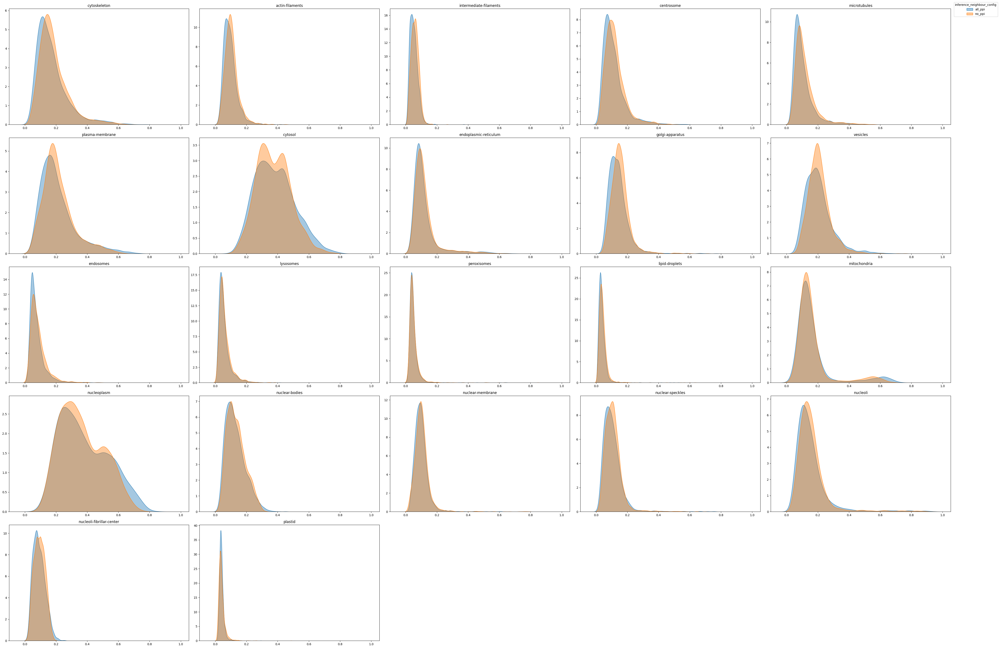

In [17]:
#Figure: Activation for proteins in each class. Shows how distribution of actiavtions change when exposed to different number of edges at inference time

labels = [col.replace('_pred', '') for col in result.columns if col.endswith('_pred') and not col.endswith('predbin')]

n_labels = len(labels)
ncols = 5
nrows = math.ceil(n_labels / ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 10, nrows * 6), sharex=True)
axes = axes.flatten()

for i, label in enumerate(labels):
    pred_col = f"{label}_pred"
    ax = axes[i]
    pred_col = f"{label}_pred"

    # Plot KDE for each inference_neighbour_config
    #for config in sorted(result['inference_neighbour_config'].unique()):
    for config in ["all_ppi", "no_ppi"]:
        subset = result[result['inference_neighbour_config'] == config]
        sns.kdeplot(subset[pred_col], label=str(config), fill=True, common_norm=False, alpha=0.4, ax=ax)
        #sns.histplot(data=subset, x=pred_col, label=str(config), bins=40, stat='density', element='step', fill=False, ax=ax, label=str(config) if i == 0 else None)

    ax.set_title(label)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(axis='x', labelbottom=True)

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

handles, labels_ = axes[0].get_legend_handles_labels()
fig.legend(handles, labels_, title='inference_neighbour_config', loc='upper right', bbox_to_anchor=(0.925, 1.0))

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(right=0.88)  # Make space for legend
plt.savefig(f"{FIG_DIR}/ppi_acitvation_change_level1.pdf",  bbox_inches='tight', dpi=300)

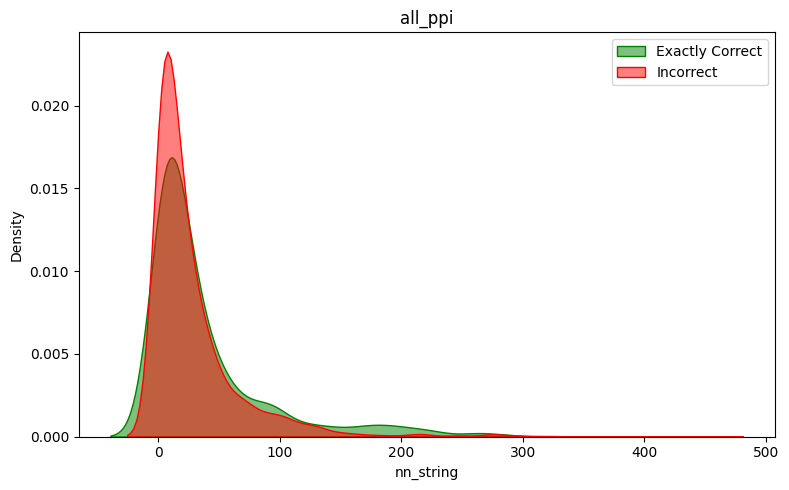

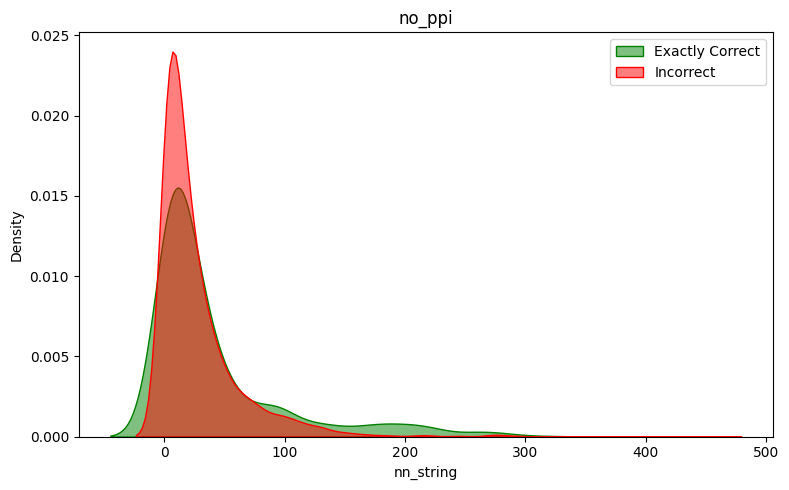

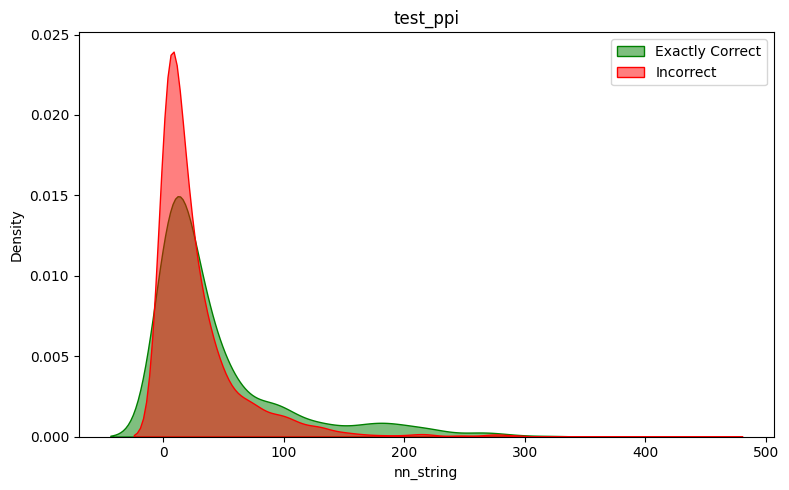

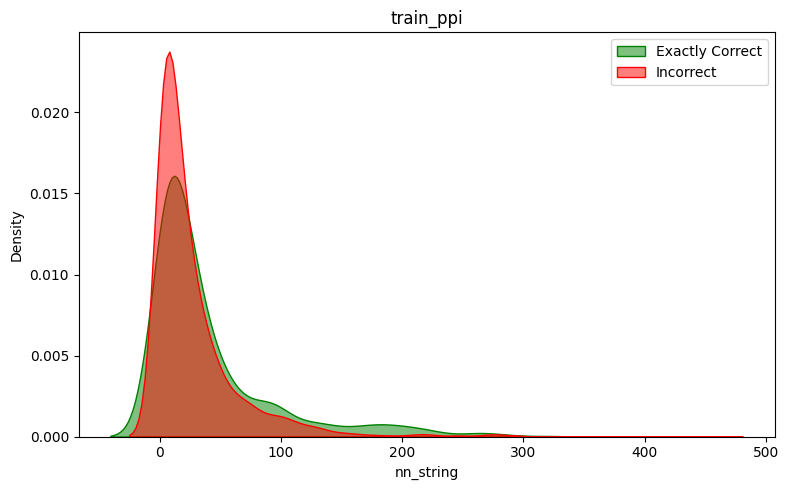

In [18]:
#Figure: Distirbution of number of edges for exactly correct vs incorrect protins
for config in sorted(result['inference_neighbour_config'].unique()):
    subset = result[result['inference_neighbour_config'] == config]

    # Split by exact_correct
    correct = subset[subset['correct_exact'] == True]
    incorrect = subset[subset['correct_exact'] == False]

    # Plot
    plt.figure(figsize=(8, 5))
    sns.kdeplot(data=correct, x='nn_string', label='Exactly Correct', fill=True, color='green', alpha=0.5)
    sns.kdeplot(data=incorrect, x='nn_string', label='Incorrect', fill=True, color='red', alpha=0.5)

    plt.title(f'{config}')
    plt.xlabel('nn_string')
    plt.ylabel('Density')
    plt.legend()
    plt.tight_layout()

    plt.savefig(f"{FIG_DIR}/ppi_exact_correct_numinteractors_{config}.pdf",  bbox_inches='tight', dpi=300)

Config: all_ppi | Mann–Whitney U p-value = nan


Config: no_ppi | Mann–Whitney U p-value = nan
Config: test_ppi | Mann–Whitney U p-value = nan
Config: train_ppi | Mann–Whitney U p-value = nan


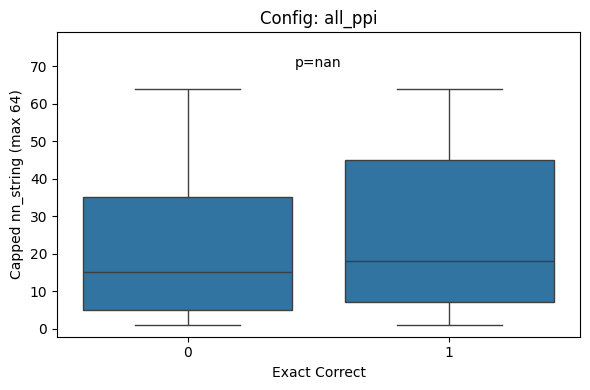

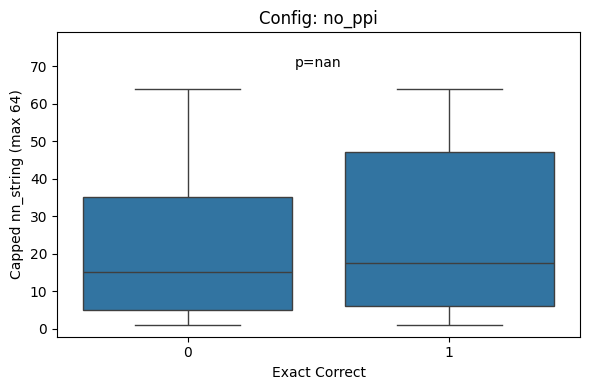

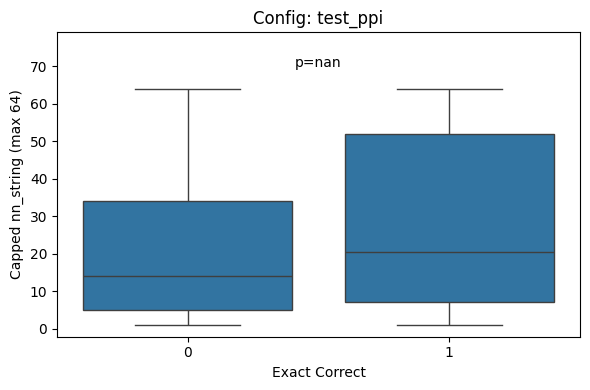

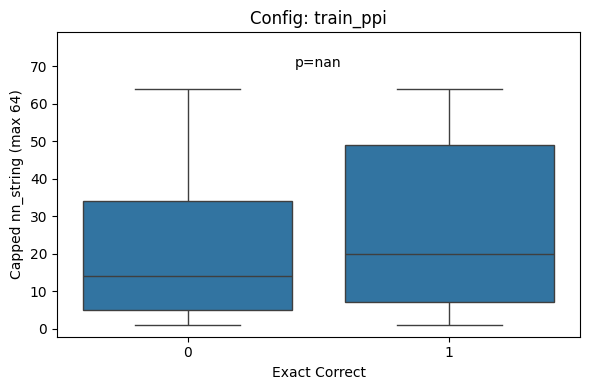

In [19]:
clip_val = 64
result['nn_string_capped'] = result['nn_string'].clip(upper=64)

# Get unique configs
configs = sorted(result['inference_neighbour_config'].unique())

# Plot one per config
for config in configs:
    subset = result[result['inference_neighbour_config'] == config]

    #Statistically significance (Don't clip for this)
    group_true = subset[subset['correct_exact'] == True]['nn_string'].to_list()
    group_false = subset[subset['correct_exact'] == False]['nn_string'].to_list()
    stat, p_value = mannwhitneyu(group_true, group_false, alternative='two-sided')
    print(f"Config: {config} | Mann–Whitney U p-value = {p_value:.10f}")


    plt.figure(figsize=(6, 4))
    sns.boxplot(x='correct_exact', y='nn_string_capped', data=subset)
    plt.text(0.5, clip_val + 5, f"p={p_value}", ha='center', va='bottom', fontsize=10)

    plt.title(f'Config: {config}')
    plt.xlabel('Exact Correct')
    plt.ylabel(f'Capped nn_string (max {clip_val})')
    plt.ylim(None, clip_val + 15)
    plt.tight_layout()
    plt.savefig(f"{FIG_DIR}/numinterators_correctvsincorrect_{config}.pdf",  bbox_inches='tight', dpi=300)

/tmp/ipykernel_19271/1855462930.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=24)
/tmp/ipykernel_19271/1855462930.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=24)
/tmp/ipykernel_19271/1855462930.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=24)
/tmp/ipykernel_19271/1855462930.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=24)


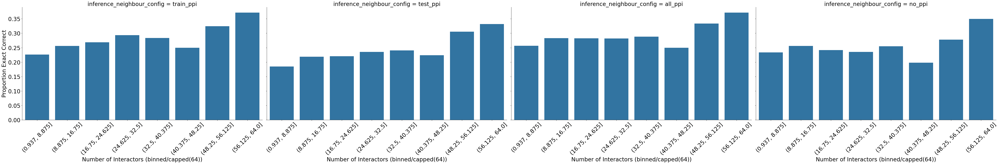

In [20]:
result['nn_bin'] = pd.cut(result['nn_string_capped'], bins=8)

# Create FacetGrid: one subplot per config
g = sns.catplot(
    data=result,
    kind="bar",
    x="nn_bin",
    y="correct_exact",
    col="inference_neighbour_config",
    col_order=["train_ppi", "test_ppi", "all_ppi", "no_ppi"],
    col_wrap=4,  # Adjust for layout
    height=10,
    aspect=1.5,
    errorbar=None,  # Remove confidence intervals for cleaner bars
)

# Rotate x-axis labels
for ax in g.axes.flatten():
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=24)
    ax.set_ylabel("Proportion Exact Correct", fontsize=24)
    ax.set_xlabel("Number of Interactors (binned/capped(64))", fontsize=24)
    ax.tick_params(axis='x', labelsize=24)
    ax.tick_params(axis='y', labelsize=24)
    ax.set_title(ax.get_title(), fontsize=24)

plt.tight_layout()
plt.savefig(f"{FIG_DIR}/numinteractors_accuracy_histogram.pdf",  bbox_inches='tight', dpi=300)

/tmp/ipykernel_19271/1522378897.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_19271/1522378897.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_19271/1522378897.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_19271/1522378897.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_19271/1522378897.py:20: FutureWarning

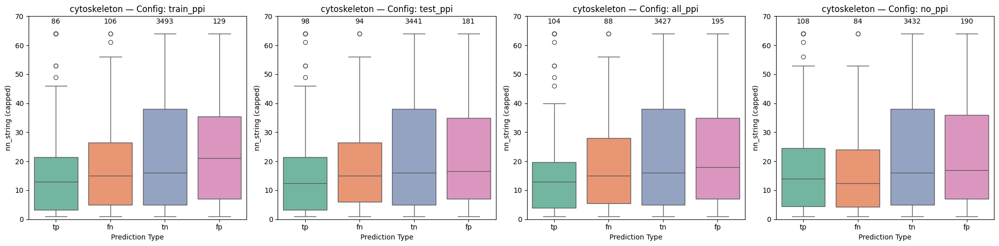

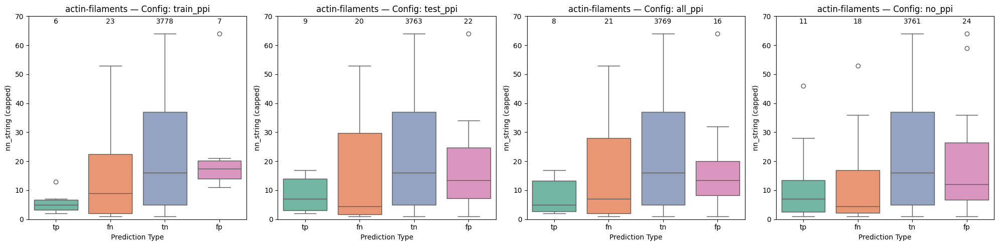

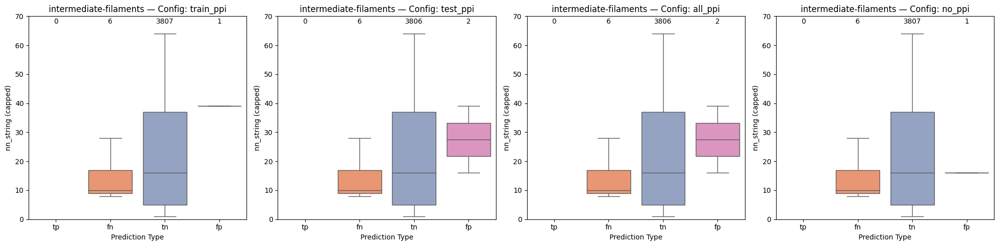

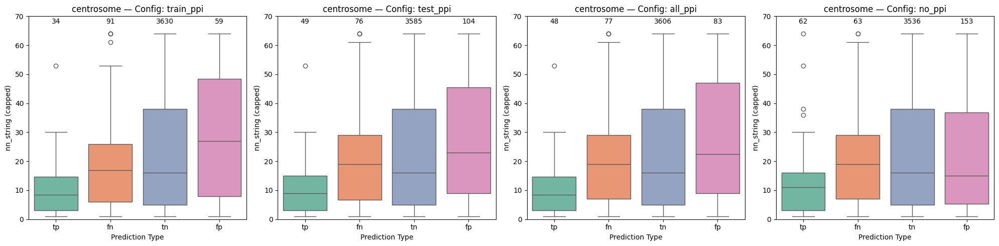

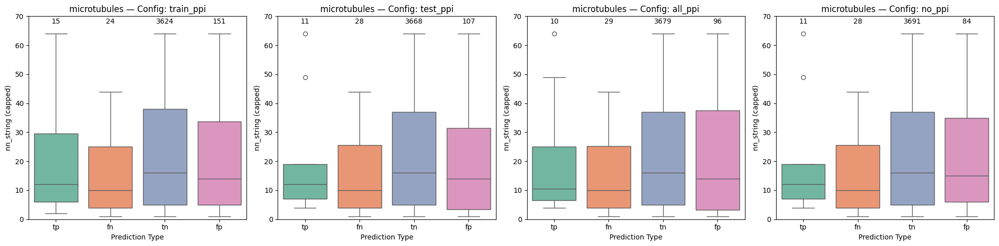

...

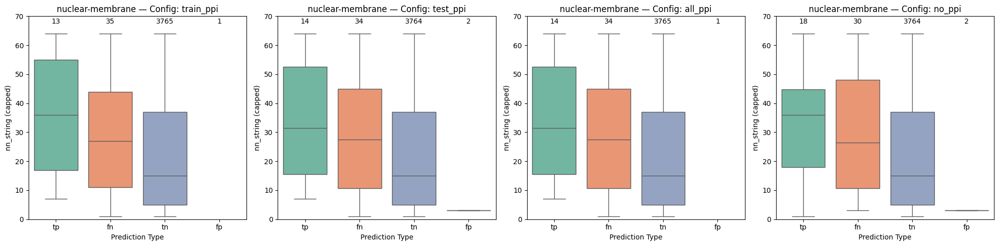

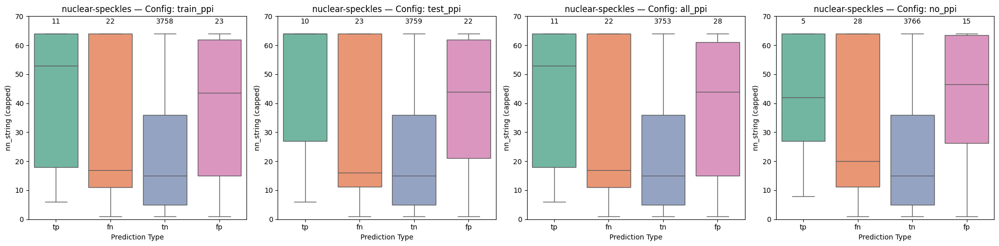

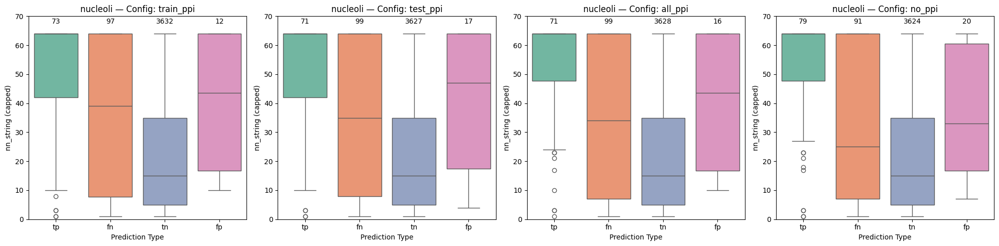

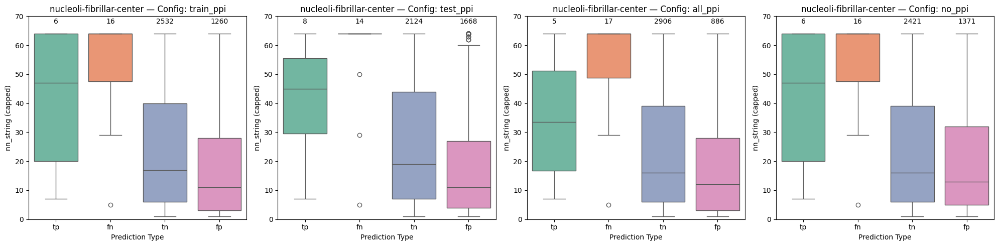

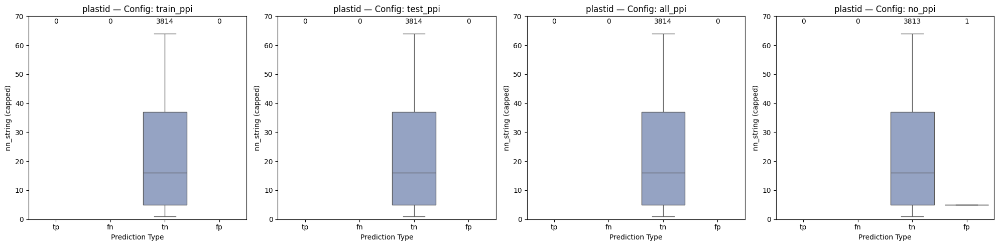

In [21]:
# Step 1: Get label names
labels = [col.replace('_true', '') for col in result.columns if col.endswith('_true')]
configs = ["train_ppi", "test_ppi", "all_ppi", "no_ppi"]

# Step 2: Plot for each label
for label in labels:
    pred_type_col = f'{label}_pred_type'

    # Set up subplots: one per config
    n_configs = len(configs)
    fig, axes = plt.subplots(1, n_configs, figsize=(5 * n_configs, 5), sharey=False)

    if n_configs == 1:
        axes = [axes]  # ensure it's iterable

    for i, config in enumerate(configs):
        ax = axes[i]
        subset = result[result['inference_neighbour_config'] == config]

        sns.boxplot(
            data=subset,
            x=pred_type_col,
            y='nn_string_capped',
            ax=ax,
            order=['tp', 'fn', 'tn', 'fp'],
            palette='Set2'
        )

        counts = subset[pred_type_col].value_counts()
        for j, ptype in enumerate(['tp', 'fn', 'tn', 'fp']):
            count = counts.get(ptype, 0)
            # Position the text above the box
            ax.text(j, clip_val + 3, str(count),
                    ha='center', va='bottom', fontsize=10, color='black')

        ax.set_title(f'{label} — Config: {config}')
        ax.set_xlabel('Prediction Type')
        ax.set_ylabel('nn_string (capped)')
        ax.set_ylim(0,70)

    plt.tight_layout()
    plt.savefig(f"{FIG_DIR}/box_whisker_tp_tn_fp_fn_{label}.pdf",  bbox_inches='tight', dpi=300)

/tmp/ipykernel_19271/1178201336.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_19271/1178201336.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_19271/1178201336.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_19271/1178201336.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_19271/1178201336.py:20: FutureWarning

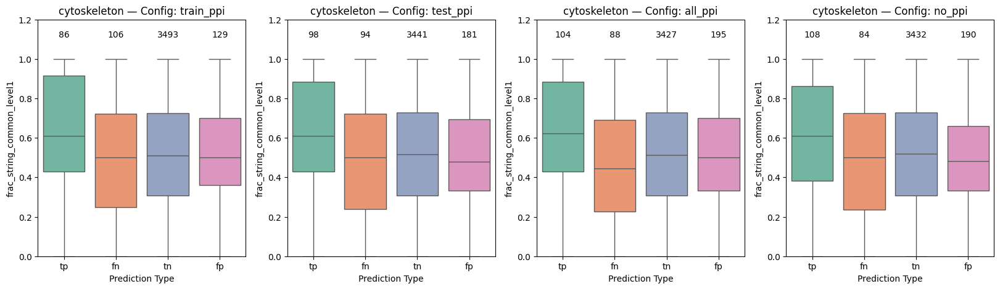

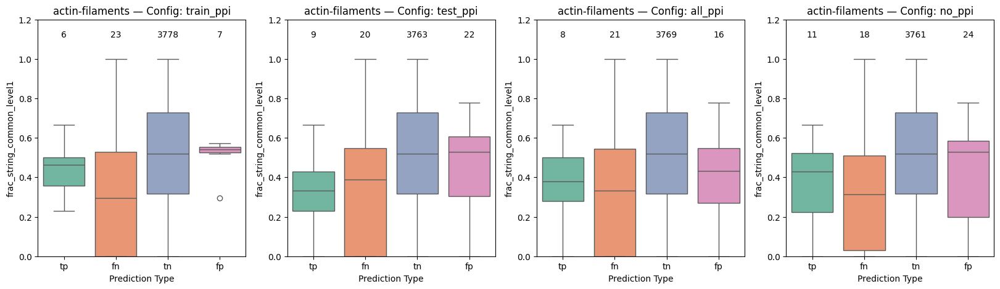

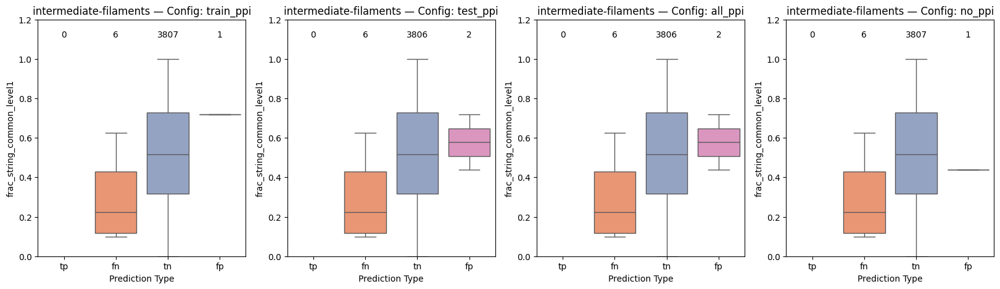

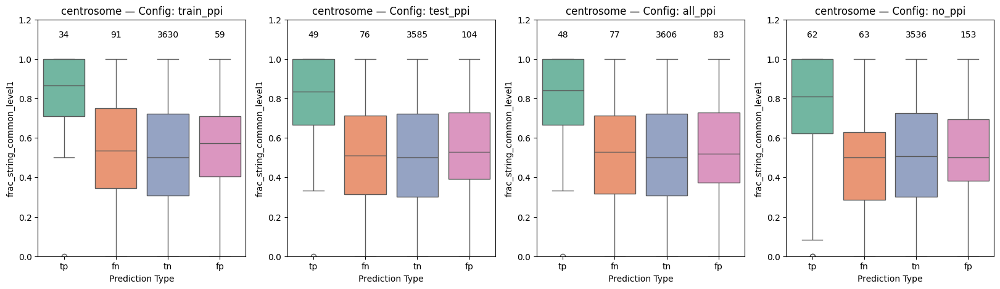

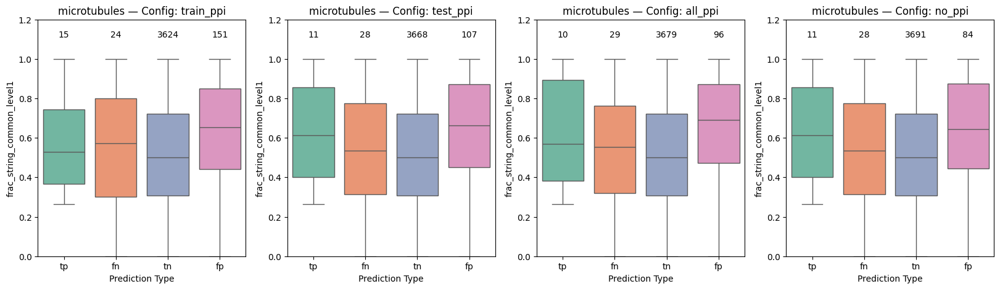

...

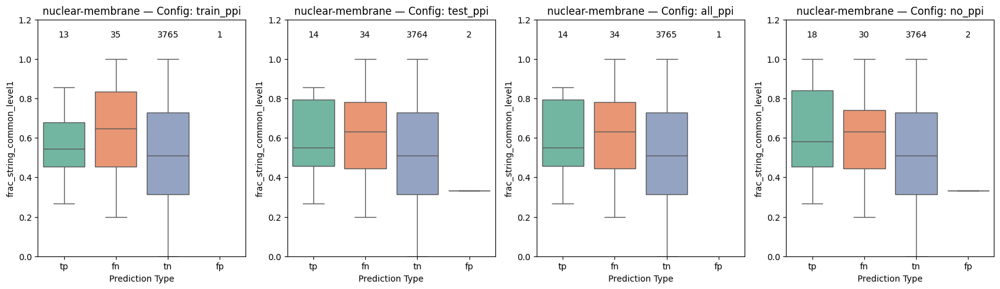

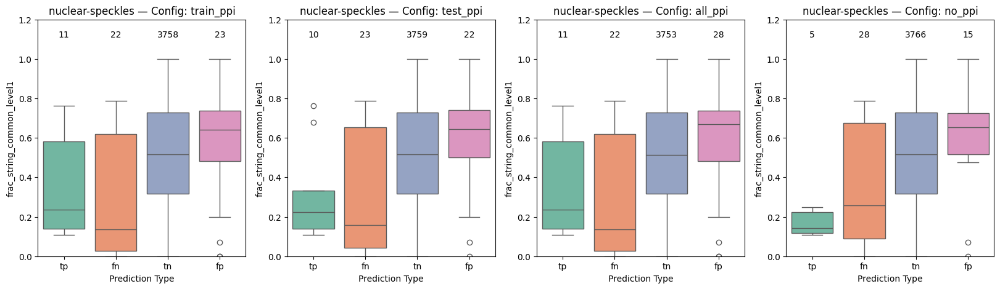

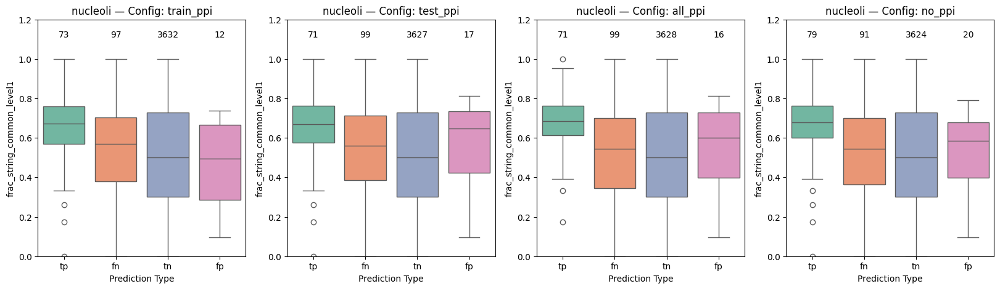

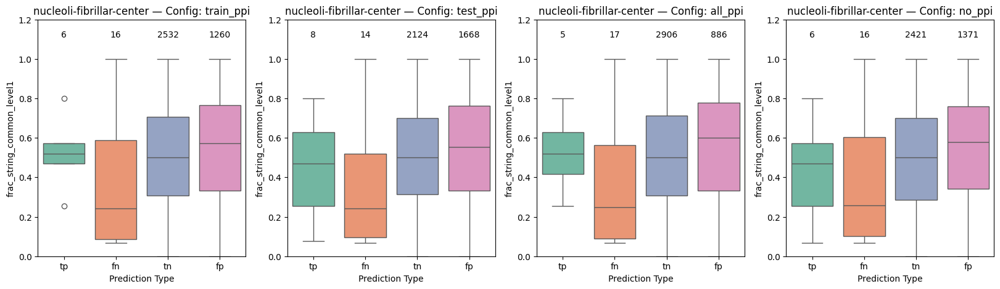

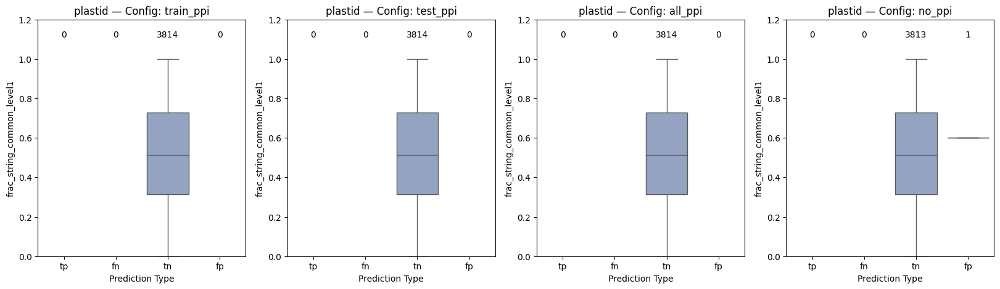

In [22]:
# Step 1: Get label names
labels = [col.replace('_true', '') for col in result.columns if col.endswith('_true')]
configs = ["train_ppi", "test_ppi", "all_ppi", "no_ppi"]

# Step 2: Plot for each label
for label in labels:
    pred_type_col = f'{label}_pred_type'

    # Set up subplots: one per config
    n_configs = len(configs)
    fig, axes = plt.subplots(1, n_configs, figsize=(5 * n_configs, 5), sharey=False)

    if n_configs == 1:
        axes = [axes]  # ensure it's iterable

    for i, config in enumerate(configs):
        ax = axes[i]
        subset = result[result['inference_neighbour_config'] == config]

        sns.boxplot(
            data=subset,
            x=pred_type_col,
            y='frac_string_common_level1',
            ax=ax,
            order=['tp', 'fn', 'tn', 'fp'],
            palette='Set2'
        )


        counts = subset[pred_type_col].value_counts()
        for j, ptype in enumerate(['tp', 'fn', 'tn', 'fp']):
            count = counts.get(ptype, 0)
            # Position the text above the box
            ax.text(j, 1.1, str(count),
                    ha='center', va='bottom', fontsize=10, color='black')

        ax.set_title(f'{label} — Config: {config}')
        ax.set_xlabel('Prediction Type')
        ax.set_ylabel('frac_string_common_level1')
        ax.set_ylim(0,1.2)

    #plt.tight_layout()
    plt.savefig(f"{FIG_DIR}/box_whisker_frac_tp_tn_fp_fn_{label}.pdf",  bbox_inches='tight', dpi=300)

In [23]:
#Figure out the number of TP<-->FN and TN<-->FP transitions between all and no ppi for inference
sub = result[result['inference_neighbour_config'].isin(['all_ppi', 'no_ppi'])].copy()

transition_counts = {}

for label in ordered_labels_level1:
    predtype_col = f"{label}_pred_type"
    pivot = sub.pivot(index='uniprot_id', columns='inference_neighbour_config', values=predtype_col)

    fn_to_tp = ((pivot['all_ppi'] == 'tp') & (pivot['no_ppi'] == 'fn')).sum()
    tp_to_fn = ((pivot['all_ppi'] == 'fn') & (pivot['no_ppi'] == 'tp')).sum()
    fp_to_tn = ((pivot['all_ppi'] == 'tn') & (pivot['no_ppi'] == 'fp')).sum()
    tn_to_fp = ((pivot['all_ppi'] == 'fp') & (pivot['no_ppi'] == 'tn')).sum()

    transition_counts[label] = {
        'TP_to_FN': tp_to_fn,
        'FN_to_TP': fn_to_tp,
        'TN_to_FP': tn_to_fp,
        'FP_to_TN': fp_to_tn
    }

transition_df = pd.DataFrame.from_dict(transition_counts, orient='index')
display(transition_df)
transition_df.to_csv(f"{FIG_DIR}/all_to_no_ppi_pred_type_transitions.csv", index=True)

,TP_to_FN,FN_to_TP,TN_to_FP,FP_to_TN
cytoskeleton,16,12,52,47
actin-filaments,5,2,2,10
intermediate-filaments,0,0,1,0
centrosome,15,1,16,86
microtubules,1,0,28,16
plasma-membrane,5,15,40,16
cytosol,73,38,139,119
endoplasmic-reticulum,0,16,22,1
golgi-apparatus,1,8,9,0
vesicles,17,29,142,25


In [24]:
change_results = []

for label in labels:
    pred_bin_col = f"{label}_predbin"
    # Inner join on uniprot_id to align proteins between configs
    merged = pd.merge(
        result[result['inference_neighbour_config'] == 'all_ppi'][['uniprot_id', pred_bin_col]],
        result[result['inference_neighbour_config'] == 'no_ppi'][['uniprot_id', pred_bin_col]],
        on='uniprot_id',
        suffixes=('_all', '_no')
    )
    num_diff = (merged[f"{pred_bin_col}_all"] != merged[f"{pred_bin_col}_no"]).sum()
    frac_diff = num_diff / len(merged) if len(merged) > 0 else float('nan')
    change_results.append({
        'label': label,
        'fraction_changed': frac_diff,
        'num_changed': num_diff,
        'total_compared': len(merged)
    })

change_df = pd.DataFrame(change_results)
print(change_df)

                        label  fraction_changed  num_changed  total_compared
0                cytoskeleton          0.033298          127            3814
1             actin-filaments          0.004982           19            3814
2      intermediate-filaments          0.000262            1            3814
3                  centrosome          0.030939          118            3814
4                microtubules          0.011799           45            3814
5             plasma-membrane          0.019927           76            3814
6                     cytosol          0.096749          369            3814
7       endoplasmic-reticulum          0.010225           39            3814
8             golgi-apparatus          0.004719           18            3814
9                    vesicles          0.055847          213            3814
10                  endosomes          0.008915           34            3814
11                  lysosomes          0.009177           35            3814

/tmp/ipykernel_19271/1579603298.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.97])


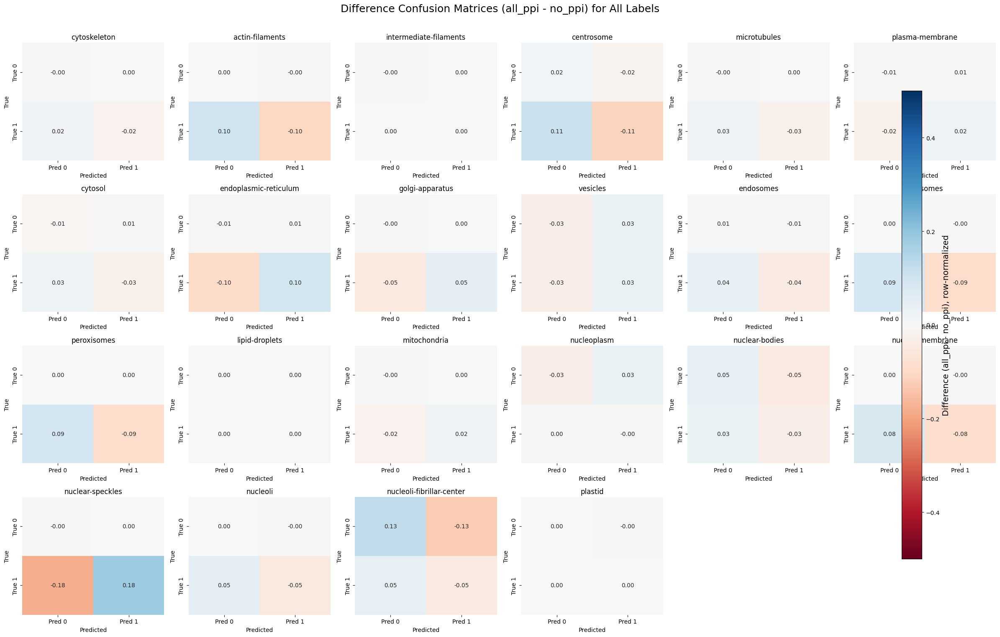

In [25]:
#Figure showing the change in confusion matrices per class when using all PPI edges versus using no PPI edges during inference

labels = [col.replace('_true', '') for col in result.columns if col.endswith('_true')]
n_labels = len(labels)
ncols = 6
nrows = int(np.ceil(n_labels / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))

vmin, vmax = -0.5, 0.5  # Color scale for difference matrices

for idx, label in enumerate(labels):
    pred_type_col = f'{label}_pred_type'
    matrices = {}
    for config in ["all_ppi", "no_ppi"]:
        subset = result[result['inference_neighbour_config'] == config]
        counts = subset[pred_type_col].value_counts()
        TP = counts.get('tp', 0)
        TN = counts.get('tn', 0)
        FP = counts.get('fp', 0)
        FN = counts.get('fn', 0)
        cm = np.array([[TN, FP],
                       [FN, TP]])
        row_sums = cm.sum(axis=1, keepdims=True)
        cm_frac = np.divide(cm, row_sums, where=row_sums!=0)
        matrices[config] = cm_frac

    diff = matrices["all_ppi"] - matrices["no_ppi"]

    # Determine subplot position
    row, col = divmod(idx, ncols)
    ax = axes[row, col] if nrows > 1 else axes[col]
    sns.heatmap(
        diff, annot=True, fmt=".2f", cmap="RdBu", center=0, vmin=vmin, vmax=vmax,
        cbar=False, ax=ax,
        xticklabels=['Pred 0', 'Pred 1'],
        yticklabels=['True 0', 'True 1']
    )
    ax.set_title(label)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')

# Hide unused subplots if any
for idx in range(n_labels, nrows * ncols):
    row, col = divmod(idx, ncols)
    fig.delaxes(axes[row, col] if nrows > 1 else axes[col])

# Add a single colorbar for all subplots
from matplotlib.cm import ScalarMappable
sm = ScalarMappable(cmap="RdBu", norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])
fig.subplots_adjust(right=0.88)  # Make space for colorbar
cbar_ax = fig.add_axes([0.90, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('Difference (all_ppi - no_ppi), row-normalized', fontsize=14)


fig.suptitle("Difference Confusion Matrices (all_ppi - no_ppi) for All Labels", fontsize=18)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.savefig(f"{FIG_DIR}/confusion_matrix_diffs_ppi.pdf", bbox_inches='tight', dpi=300)


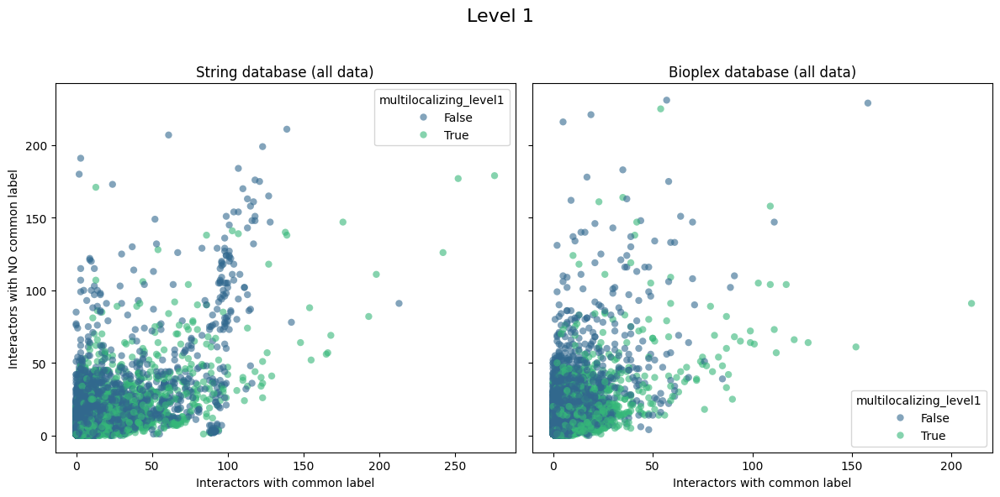

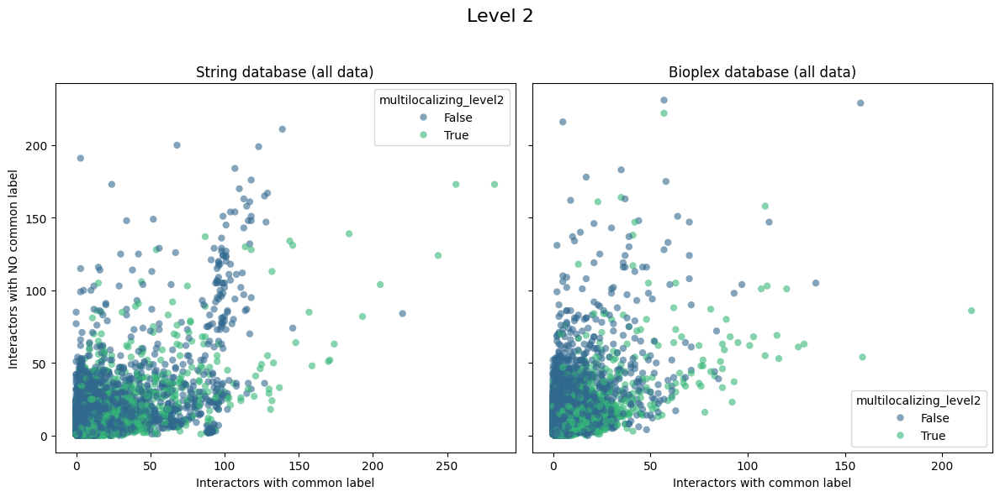

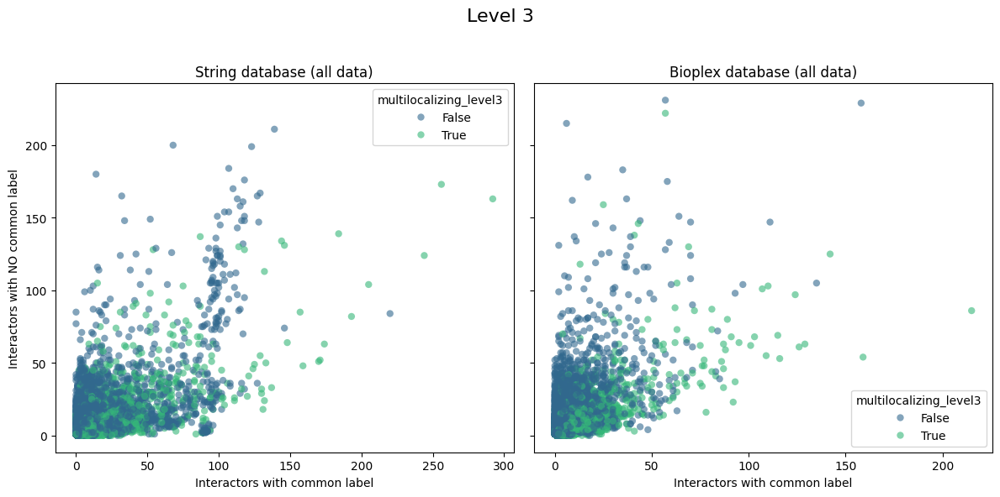

In [26]:
for level in [1, 2, 3]:
    fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)
    fig.suptitle(f"Level {level}", fontsize=16)

    multi_col = f"multilocalizing_level{level}"

    for i, database in enumerate(["string", "bioplex"]):
        ax = axes[i]

        x = all_data[f'nn_{database}_common_level{level}']
        y = all_data[f'nn_{database}'] - x
        
        valid = x.notna() & y.notna()

        sns.scatterplot(
            x=x[valid],
            y=y[valid],
            hue=all_data.loc[valid, multi_col],
            palette="viridis",
            alpha=0.6,
            edgecolor="none",
            ax=ax
        )

        ax.set_title(f"{database.capitalize()} database (all data)")
        ax.set_xlabel("Interactors with common label")
        if i == 0:
            ax.set_ylabel("Interactors with NO common label")
        ax.grid(False)


    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(f"{FIG_DIR}/scatterplot_common_uncommon_neighbors_multiloc.pdf", bbox_inches='tight', dpi=300)

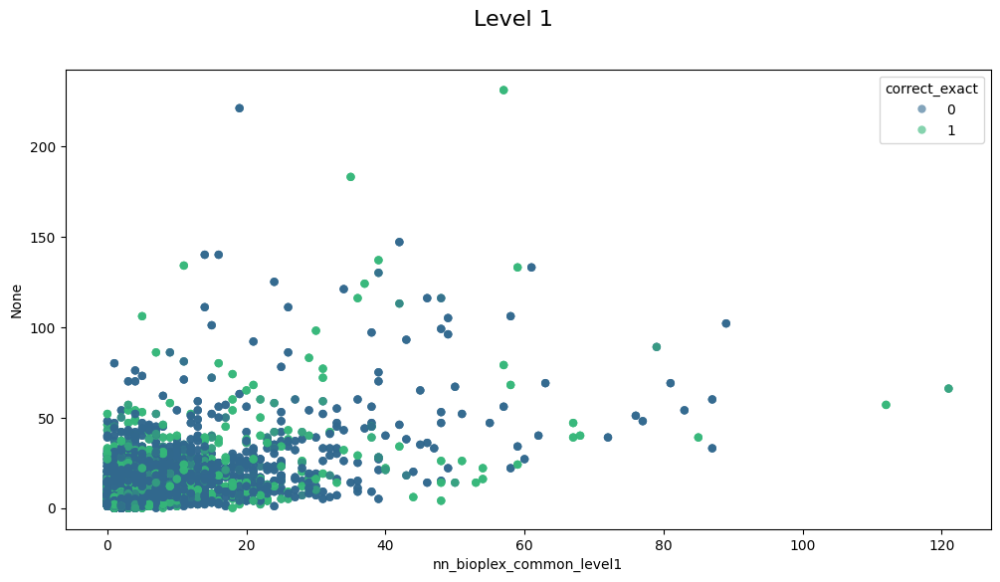

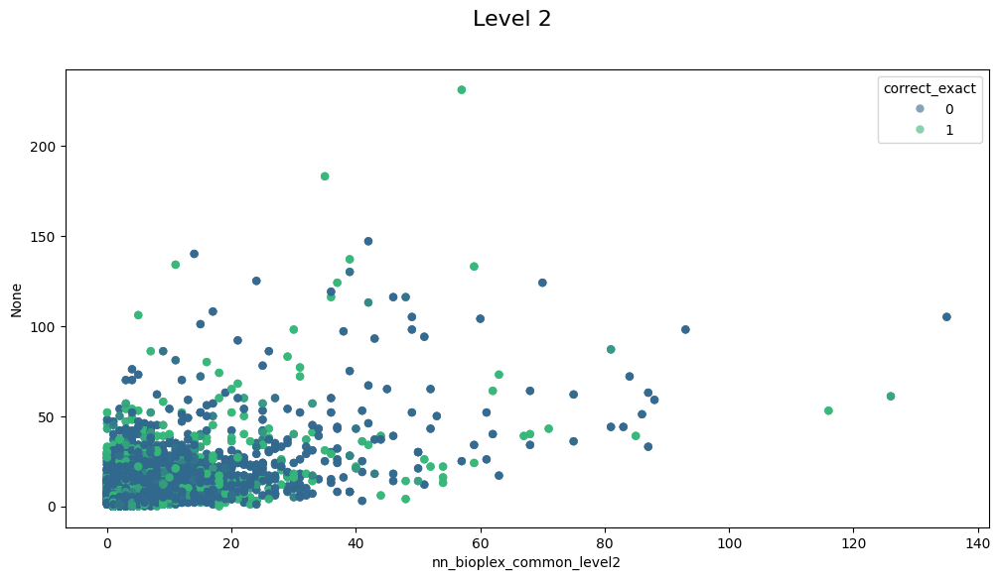

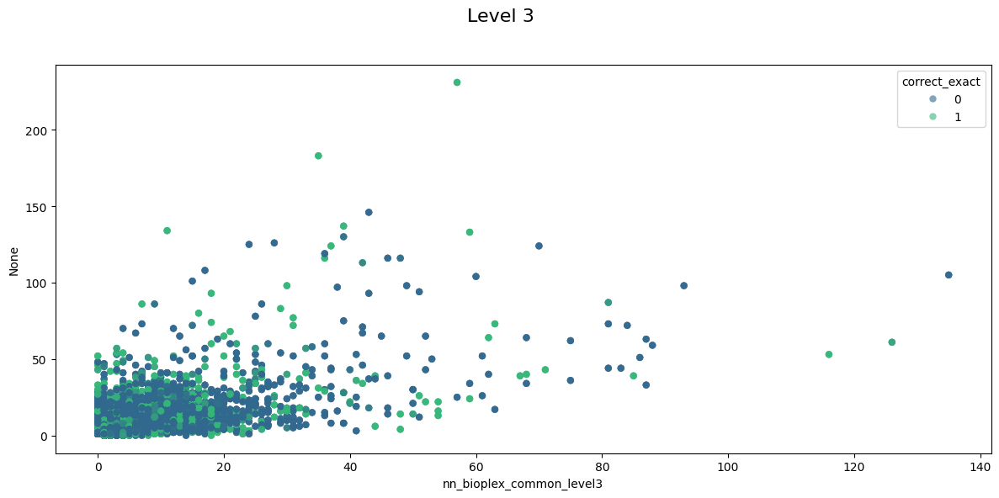

In [27]:
for level in [1, 2, 3]:
    fig, axes = plt.subplots(figsize=(12, 6), sharey=True)
    fig.suptitle(f"Level {level}", fontsize=16)
    x = result[f'nn_{database}_common_level{level}']
    y = result[f'nn_{database}'] - x
    
    valid = x.notna() & y.notna()

    sns.scatterplot(
        x=x[valid],
        y=y[valid],
        hue=result.loc[valid, "correct_exact"],
        palette="viridis",
        alpha=0.6,
        edgecolor="none"
    )

    ax.set_title(f"{database.capitalize()} database (testset)")
    ax.set_xlabel("Interactors with common label")
    ax.set_ylabel("Interactors with NO common label")
    ax.grid(False)


plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig(f"{FIG_DIR}/scatterplot_common_uncommon_neighbors_correct.pdf", bbox_inches='tight', dpi=300)

/tmp/ipykernel_19271/775889654.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = result_all_or_no_ppi.groupby(
/tmp/ipykernel_19271/775889654.py:62: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = result_all_or_no_ppi.groupby(
/tmp/ipykernel_19271/775889654.py:82: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for (config, frac_bin), group in result_all_or_no_ppi.groupby(['inference_neighbour_config', 'fr

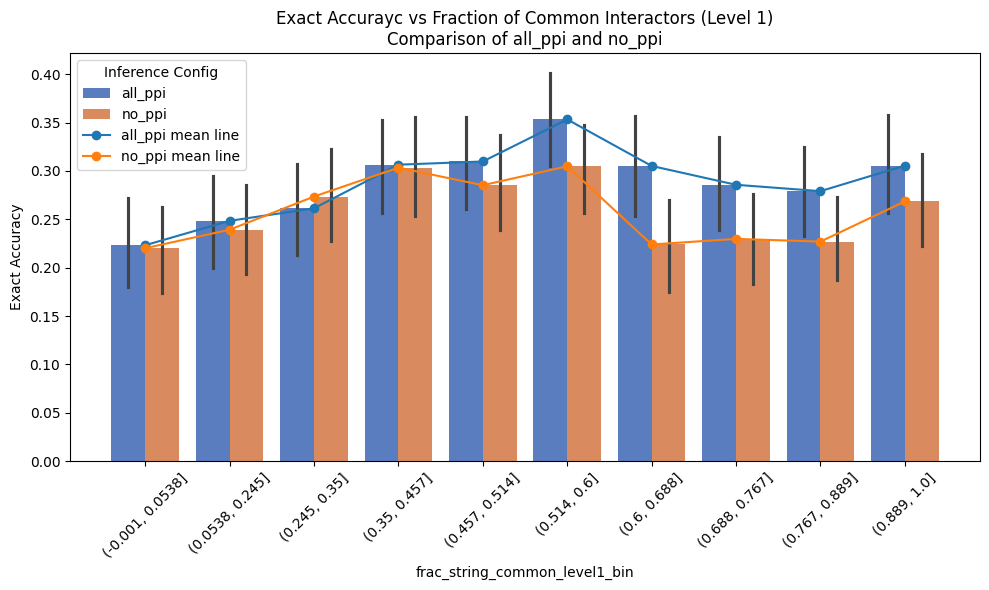

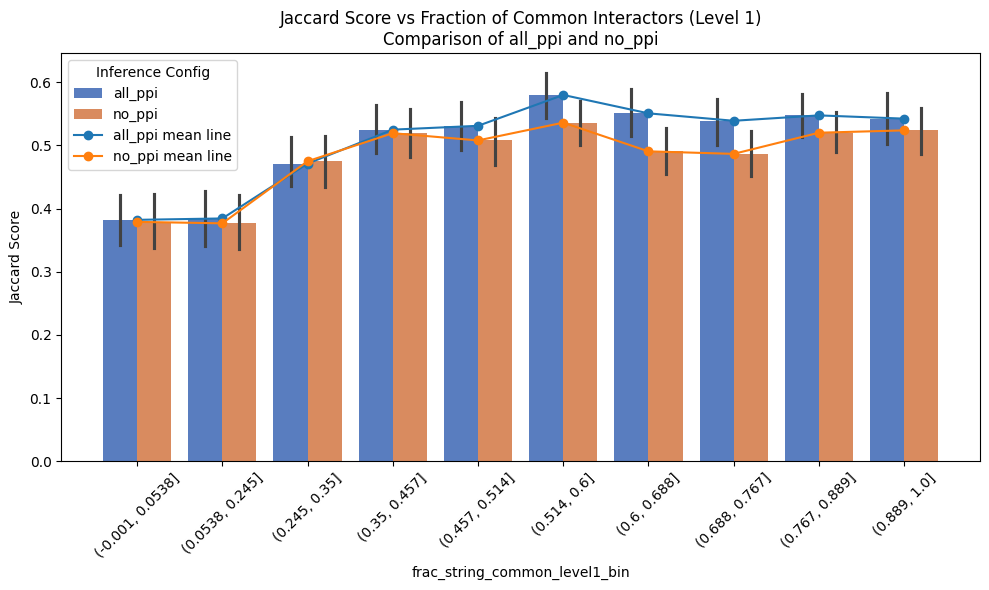

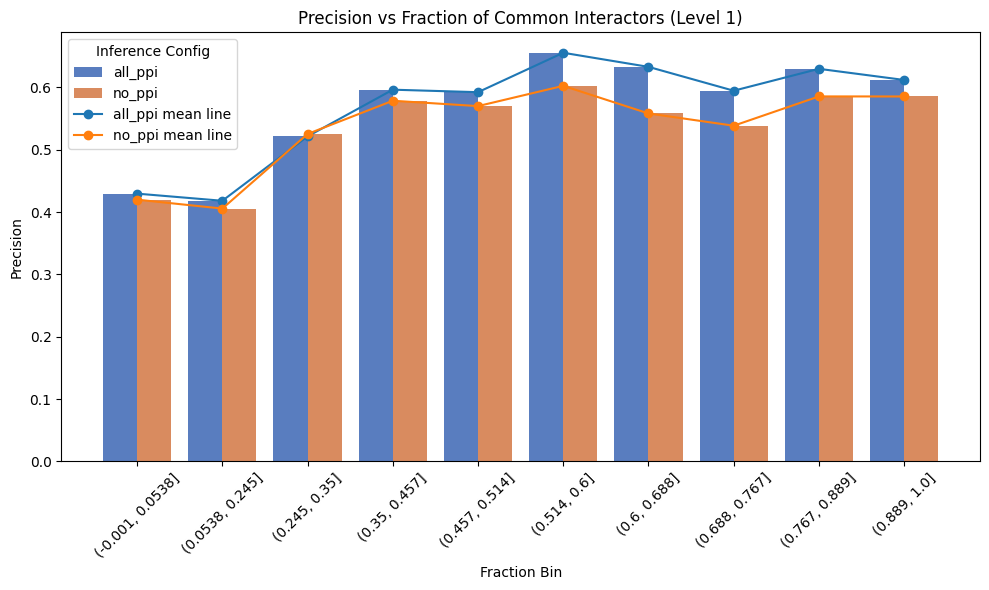

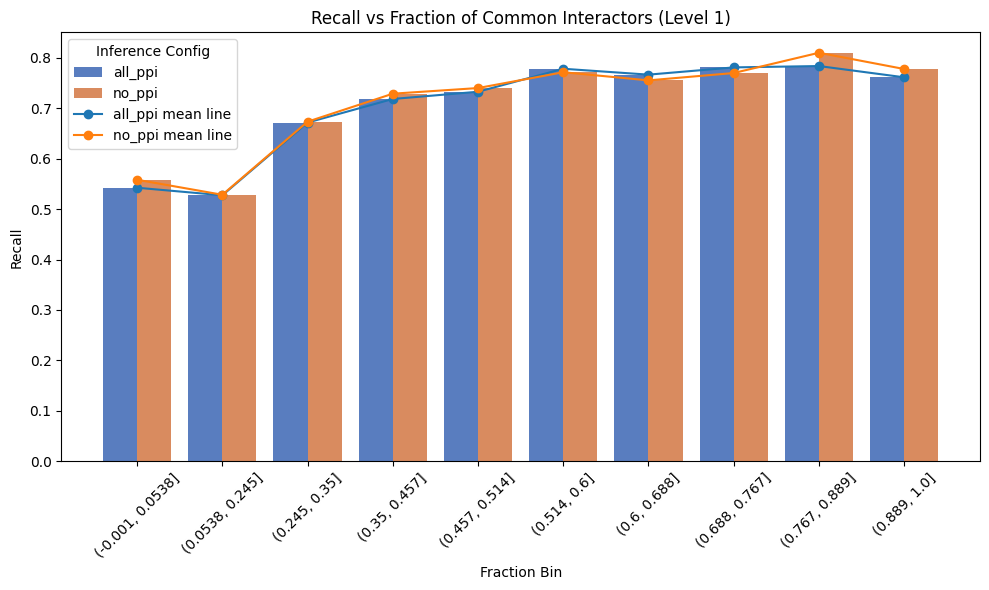

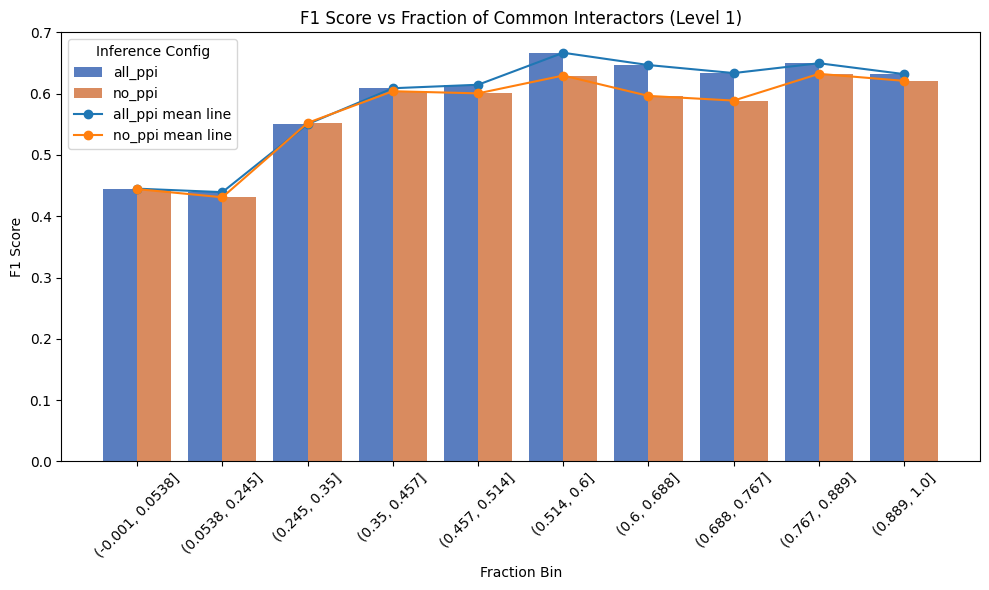

In [28]:
n_bins = 10

# ---------- Prepare data ----------
label_cols_true = [f"{label}_true" for label in ordered_labels_level1]
label_cols_pred = [c.replace("_true", "_predbin") for c in label_cols_true]

#Compute bins for "frac_string_common_level1" with equal number of samples
temp = result[result["inference_neighbour_config"] == "all_ppi"]
quantiles = np.linspace(0, 1, n_bins + 1)
edges = temp["frac_string_common_level1"].quantile(quantiles).to_numpy() #Ignores NaN values
result["frac_string_common_level1_bin"] = pd.cut(result["frac_string_common_level1"], bins=edges, include_lowest=True)

#Only comparing all_ppi and no_ppi
result_all_or_no_ppi = result[result["inference_neighbour_config"].isin(["all_ppi", "no_ppi"])]

#Only want to look at proteins actually in STRING database, or else not a fair comparison
result_all_or_no_ppi = result_all_or_no_ppi[result_all_or_no_ppi["frac_string_common_level1_bin"].notna()]

# ---------- Plot Exact Accuracy ----------
plt.figure(figsize=(10, 6))
sns.barplot(
    data=result_all_or_no_ppi, 
    x='frac_string_common_level1_bin', 
    y='correct_exact', 
    hue='inference_neighbour_config', 
    errorbar=('ci', 95), 
    palette='muted'
)

# Compute means per config and bin for line plot
means = result_all_or_no_ppi.groupby(
    ['frac_string_common_level1_bin', 'inference_neighbour_config']
    )['correct_exact'].mean().reset_index()

# Plot lines connecting means for each config
for config_name in means['inference_neighbour_config'].unique():
    sub = means[means['inference_neighbour_config'] == config_name]
    x_vals = range(len(sub))
    plt.plot(x_vals, sub['correct_exact'], marker='o', label=f"{config_name} mean line")

plt.xticks(rotation=45)
plt.ylabel('Exact Accuracy')
plt.title('Exact Accurayc vs Fraction of Common Interactors (Level 1)\nComparison of all_ppi and no_ppi')
plt.legend(title='Inference Config')
plt.tight_layout()
plt.savefig(f"{FIG_DIR}/acc_vs_common_frac_barplot.pdf", bbox_inches='tight', dpi=300)



# ---------- Plot per-sample Jaccard Score ----------
plt.figure(figsize=(10, 6))
sns.barplot(
    data=result_all_or_no_ppi, 
    x='frac_string_common_level1_bin', 
    y='jaccard_per_sample', 
    hue='inference_neighbour_config', 
    errorbar=('ci', 95), 
    palette='muted'
)

# Compute means per config and bin for line plot
means = result_all_or_no_ppi.groupby(
    ['frac_string_common_level1_bin', 'inference_neighbour_config']
    )['jaccard_per_sample'].mean().reset_index()

# Plot lines connecting means for each config
for config_name in means['inference_neighbour_config'].unique():
    sub = means[means['inference_neighbour_config'] == config_name]
    x_vals = range(len(sub))
    plt.plot(x_vals, sub['jaccard_per_sample'], marker='o', label=f"{config_name} mean line")

plt.xticks(rotation=45)
plt.ylabel('Jaccard Score')
plt.title('Jaccard Score vs Fraction of Common Interactors (Level 1)\nComparison of all_ppi and no_ppi')
plt.legend(title='Inference Config')
plt.tight_layout()
plt.savefig(f"{FIG_DIR}/jaccard_vs_common_frac_barplot.pdf", bbox_inches='tight', dpi=300)


# ---------- Compute binned recall, precision and F1 score ----------
metrics_list = []
for (config, frac_bin), group in result_all_or_no_ppi.groupby(['inference_neighbour_config', 'frac_string_common_level1_bin']):
    y_true = group[label_cols_true].to_numpy()
    y_pred = group[label_cols_pred].to_numpy()

    prec = precision_score(y_true, y_pred, average="samples", zero_division=0)
    rec = recall_score(y_true, y_pred, average="samples", zero_division=0)
    f1 = f1_score(y_true, y_pred, average="samples", zero_division=0)
   
    metrics_list.append({
        "config": config,
        "frac_bin": frac_bin,
        "Precision": prec,
        "Recall": rec,
        "F1 Score": f1
    })

metrics_df = pd.DataFrame(metrics_list)

metrics_df['frac_bin_str'] = metrics_df['frac_bin'].astype(str)

metrics = ["Precision", "Recall", "F1 Score"]
configs = metrics_df['config'].unique()

for metric in metrics:
    plt.figure(figsize=(10, 6))
    
    # Bar plot without confidence interval
    sns.barplot(
        data=metrics_df,
        x='frac_bin_str',
        y=metric,
        hue='config',
        palette='muted'
    )
    
    # Overlay line plots of means per config
    for config in configs:
        sub = metrics_df[metrics_df['config'] == config]
        x_vals = np.arange(len(sub))
        plt.plot(x_vals, sub[metric], marker='o', linestyle='-', label=f"{config} mean line")
    
    plt.xticks(rotation=45)
    plt.xlabel('Fraction Bin')
    plt.ylabel(metric)
    plt.title(f'{metric} vs Fraction of Common Interactors (Level 1)')
    plt.legend(title='Inference Config')
    plt.tight_layout()
    plt.savefig(f"{FIG_DIR}/{metric}_vs_common_frac_barplot.pdf", bbox_inches='tight', dpi=300)

/tmp/ipykernel_19271/3060504380.py:68: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for (config, frac_bin), group in result_all_or_no_ppi.groupby(['inference_neighbour_config', 'frac_string_common_level1_bin']):


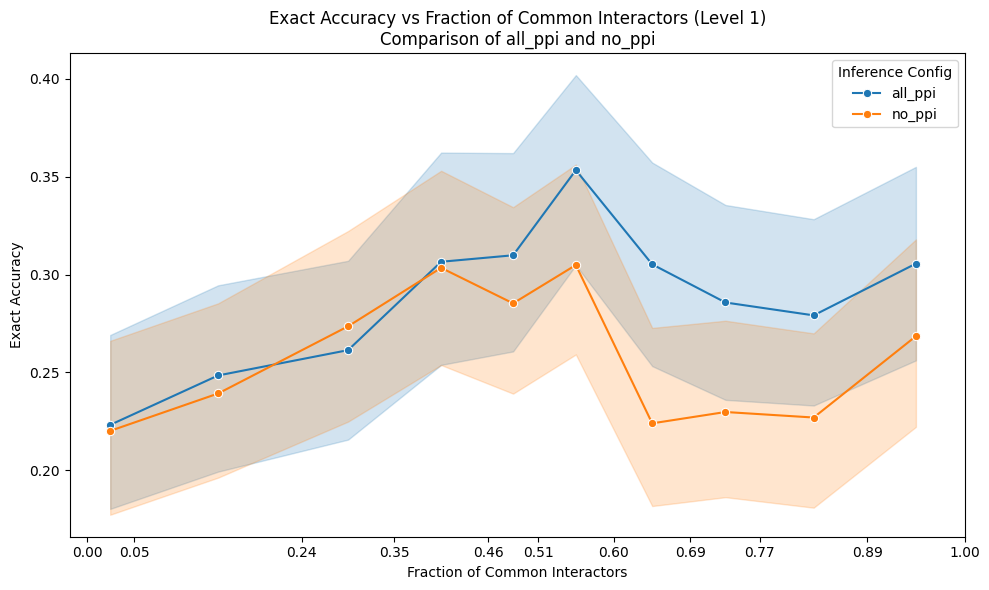

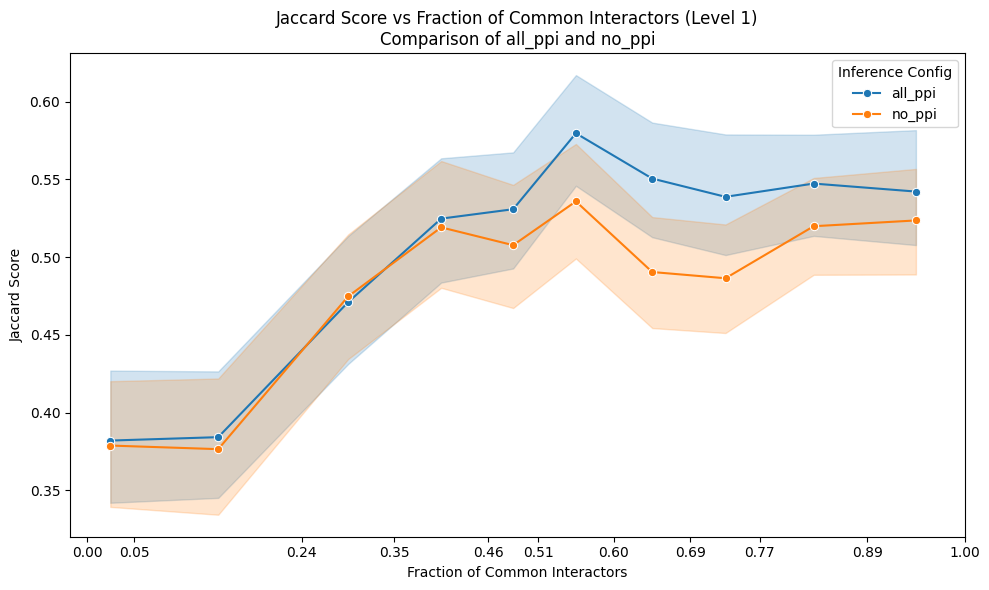

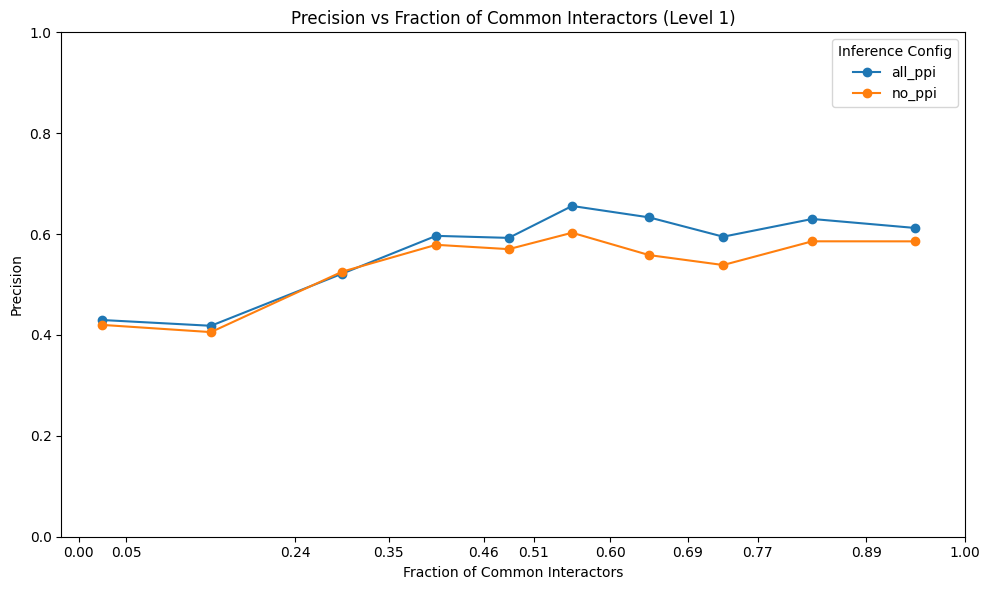

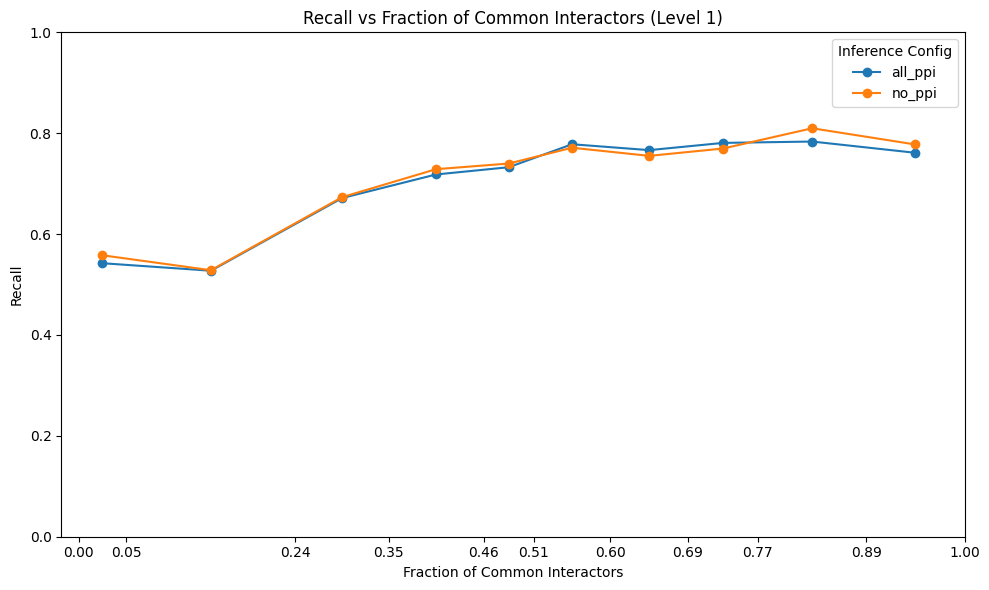

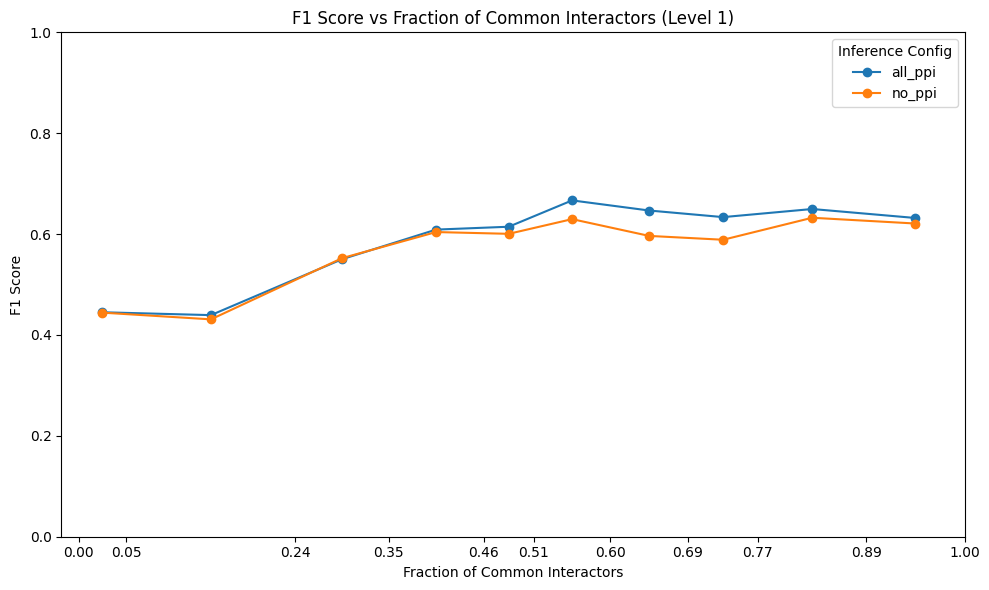

In [29]:
n_bins = 10

# ---------- Prepare data ----------
label_cols_true = [f"{label}_true" for label in ordered_labels_level1]
label_cols_pred = [c.replace("_true", "_predbin") for c in label_cols_true]

# Compute bins for "frac_string_common_level1" with equal number of samples
temp = result[result["inference_neighbour_config"] == "all_ppi"]
quantiles = np.linspace(0, 1, n_bins + 1)
edges = temp["frac_string_common_level1"].quantile(quantiles)  # Ignores NaN values
edges = edges.drop_duplicates().to_numpy()
result["frac_string_common_level1_bin"] = pd.cut(result["frac_string_common_level1"], bins=edges, include_lowest=True)

# Only comparing all_ppi and no_ppi
result_all_or_no_ppi = result[result["inference_neighbour_config"].isin(["all_ppi", "no_ppi"])]

# Only want to look at proteins actually in STRING database, or else not a fair comparison
result_all_or_no_ppi = result_all_or_no_ppi[result_all_or_no_ppi["frac_string_common_level1_bin"].notna()]

# Compute bin centers for plotting
bin_centers = {interval: (interval.left + interval.right) / 2 for interval in result_all_or_no_ppi["frac_string_common_level1_bin"].cat.categories}
result_all_or_no_ppi['bin_center'] = result_all_or_no_ppi['frac_string_common_level1_bin'].map(bin_centers)

# Helper for xtick formatting
def set_bin_edge_xticks(edges):
    plt.xticks(edges, [f"{e:.2f}" for e in edges])

# ---------- Plot Exact Accuracy with CI ----------
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=result_all_or_no_ppi,
    x='bin_center',
    y='correct_exact',
    hue='inference_neighbour_config',
    estimator='mean',
    errorbar=('ci', 95),
    marker='o'
)
plt.xlabel('Fraction of Common Interactors')
plt.ylabel('Exact Accuracy')
plt.title('Exact Accuracy vs Fraction of Common Interactors (Level 1)\nComparison of all_ppi and no_ppi')
plt.legend(title='Inference Config')
set_bin_edge_xticks(edges)
plt.tight_layout()
plt.savefig(f"{FIG_DIR}/acc_vs_common_frac_lineplot.pdf", bbox_inches='tight', dpi=300)

# ---------- Plot per-sample Jaccard Score with CI ----------
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=result_all_or_no_ppi,
    x='bin_center',
    y='jaccard_per_sample',
    hue='inference_neighbour_config',
    estimator='mean',
    errorbar=('ci', 95),
    marker='o'
)
plt.xlabel('Fraction of Common Interactors')
plt.ylabel('Jaccard Score')
plt.title('Jaccard Score vs Fraction of Common Interactors (Level 1)\nComparison of all_ppi and no_ppi')
plt.legend(title='Inference Config')
set_bin_edge_xticks(edges)
plt.tight_layout()
plt.savefig(f"{FIG_DIR}/jaccard_vs_common_frac_lineplot.pdf", bbox_inches='tight', dpi=300)

# ---------- Compute binned recall, precision and F1 score ----------
metrics_list = []
for (config, frac_bin), group in result_all_or_no_ppi.groupby(['inference_neighbour_config', 'frac_string_common_level1_bin']):
    y_true = group[label_cols_true].to_numpy()
    y_pred = group[label_cols_pred].to_numpy()

    prec = precision_score(y_true, y_pred, average="samples", zero_division=0)
    rec = recall_score(y_true, y_pred, average="samples", zero_division=0)
    f1 = f1_score(y_true, y_pred, average="samples", zero_division=0)
   
    metrics_list.append({
        "config": config,
        "frac_bin": frac_bin,
        "Precision": prec,
        "Recall": rec,
        "F1 Score": f1
    })

metrics_df = pd.DataFrame(metrics_list)
metrics_df['bin_center'] = metrics_df['frac_bin'].map(bin_centers)

metrics = ["Precision", "Recall", "F1 Score"]
configs = metrics_df['config'].unique()

for metric in metrics:
    plt.figure(figsize=(10, 6))
    for config in configs:
        sub = metrics_df[metrics_df['config'] == config]
        plt.plot(sub['bin_center'], sub[metric], marker='o', label=f"{config}")
    plt.ylim(0, 1)
    plt.xlabel('Fraction of Common Interactors')
    plt.ylabel(metric)
    plt.title(f'{metric} vs Fraction of Common Interactors (Level 1)')
    plt.legend(title='Inference Config')
    set_bin_edge_xticks(edges)
    plt.tight_layout()
    plt.savefig(f"{FIG_DIR}/{metric}_vs_common_frac_lineplot.pdf", bbox_inches='tight', dpi=300)

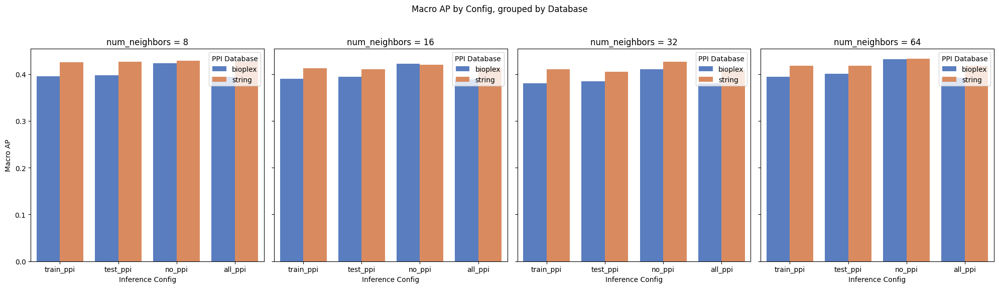

In [30]:
temp =  overall[overall.category_level == "level1"]

neighbor_values = [8, 16, 32, 64]
n_neighbors = len(neighbor_values)
fig, axes = plt.subplots(1, n_neighbors, figsize=(5*n_neighbors, 6), sharey=True)

for ax, n in zip(axes, neighbor_values):
    subdf = temp[temp['num_neighbors'] == n]
    sns.barplot(
        data=subdf,
        x='inference_neighbour_config',
        y='macro_ap',
        hue='ppi_database',
        palette='muted',
        ax=ax
    )
    ax.set_title(f'num_neighbors = {n}')
    ax.set_xlabel('Inference Config')
    ax.set_ylabel('Macro AP' if ax==axes[0] else "")
    ax.legend(title='PPI Database')

plt.suptitle('Macro AP by Config, grouped by Database')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig(f"{FIG_DIR}/string_vs_bioplex.pdf", bbox_inches='tight', dpi=300)

In [31]:
list(result.columns)

['uniprot_id',
 'inference_neighbour_config',
 'cytoskeleton_true',
 'actin-filaments_true',
 'intermediate-filaments_true',
 'centrosome_true',
 'microtubules_true',
 'plasma-membrane_true',
 'cytosol_true',
 'endoplasmic-reticulum_true',
 'golgi-apparatus_true',
 'vesicles_true',
 'endosomes_true',
 'lysosomes_true',
 'peroxisomes_true',
 'lipid-droplets_true',
 'mitochondria_true',
 'nucleoplasm_true',
 'nuclear-bodies_true',
 'nuclear-membrane_true',
 'nuclear-speckles_true',
 'nucleoli_true',
 'nucleoli-fibrillar-center_true',
 'plastid_true',
 'cytoskeleton_pred',
 'actin-filaments_pred',
 'intermediate-filaments_pred',
 'centrosome_pred',
 'microtubules_pred',
 'plasma-membrane_pred',
 'cytosol_pred',
 'endoplasmic-reticulum_pred',
 'golgi-apparatus_pred',
 'vesicles_pred',
 'endosomes_pred',
 'lysosomes_pred',
 'peroxisomes_pred',
 'lipid-droplets_pred',
 'mitochondria_pred',
 'nucleoplasm_pred',
 'nuclear-bodies_pred',
 'nuclear-membrane_pred',
 'nuclear-speckles_pred',
 'nucl

In [32]:
scatter_data = []

for label in ordered_labels_level1:
    is_label_present = result[(result[f'{label}_true'] == 1) & result['nn_string'].notna()] #in STRING and contains label
    all_ppi = is_label_present[(is_label_present['inference_neighbour_config'] == 'all_ppi')]
    no_ppi = is_label_present[(is_label_present['inference_neighbour_config'] == 'no_ppi')]
    
    merged = pd.merge(
        all_ppi[['uniprot_id', f'{label}_pred', f'{label}_pred_type', f'nn_string_{label}_level1', 'nn_string']],
        no_ppi[['uniprot_id', f'{label}_pred', f'{label}_pred_type']],
        on='uniprot_id',
        suffixes=('_all_ppi', '_no_ppi')
    )
    
    # Compute activation difference
    merged['activation_diff'] = merged[f'{label}_pred_all_ppi'] - merged[f'{label}_pred_no_ppi']
    merged['activation_ratio'] = merged[f'{label}_pred_all_ppi'] / merged[f'{label}_pred_no_ppi']
    merged['activation_percent_change'] = (merged[f'{label}_pred_all_ppi'] - merged[f'{label}_pred_no_ppi']) / merged[f'{label}_pred_no_ppi']
    merged['frac_interactors'] = merged[f'nn_string_{label}_level1'] / merged['nn_string']
    merged['label'] = label
    merged['predtype_change'] = merged[f'{label}_pred_type_no_ppi'] + '_to_' + merged[f'{label}_pred_type_all_ppi']

    scatter_data.append(merged)

scatter_data = pd.concat(scatter_data).reset_index(drop=True)


In [33]:
transition_palette = {
    "tp_to_fn": "#e41a1c",   # red
    "fn_to_fn": "#ffcccc",   # blue
    "tp_to_tp": "#add8e6",   # green
    "fn_to_tp": "#377eb8",   # orange
}

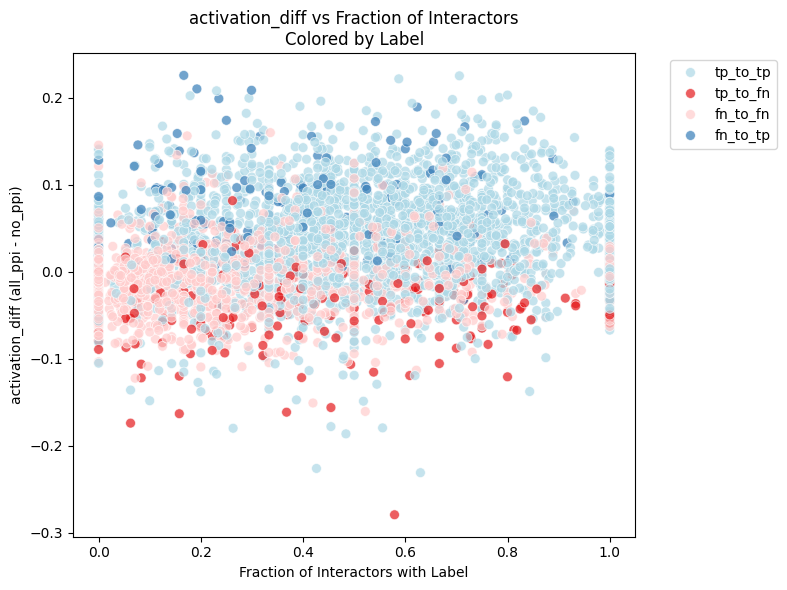

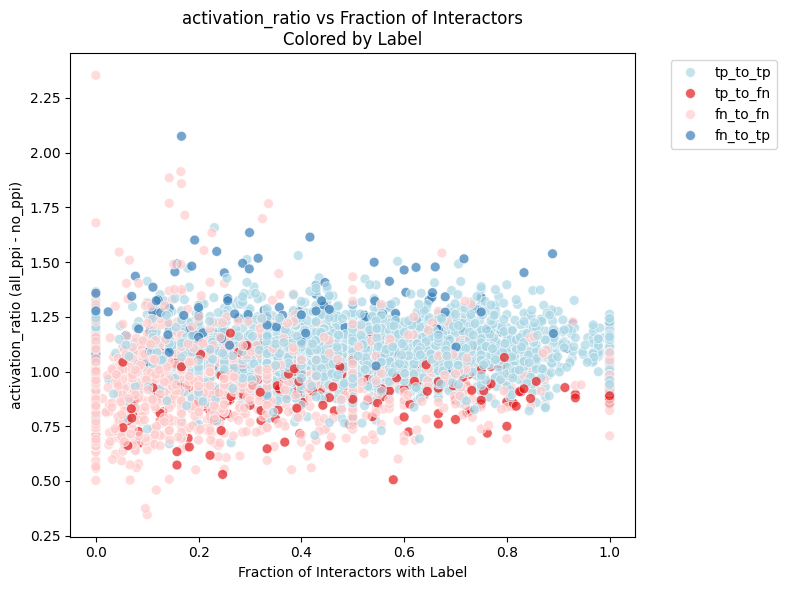

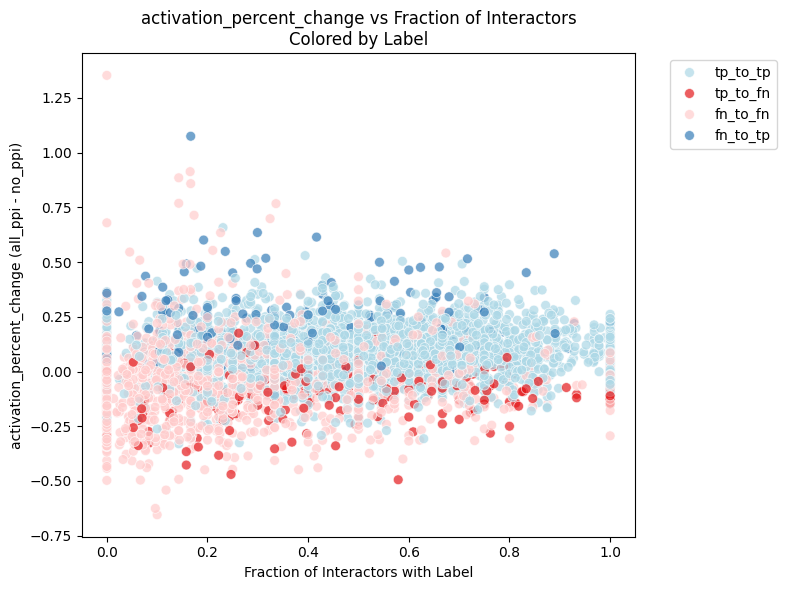

In [34]:
for y_label in ["activation_diff", "activation_ratio", "activation_percent_change"]:
    plt.figure(figsize=(8,6))
    sns.scatterplot(
        data=scatter_data,
        x='frac_interactors',
        y=y_label,
        hue='predtype_change',
        palette=transition_palette,
        alpha=0.7,
        s=50
    )
    plt.xlabel("Fraction of Interactors with Label")
    plt.ylabel(f"{y_label} (all_ppi - no_ppi)")
    plt.title(f"{y_label} vs Fraction of Interactors\nColored by Label")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

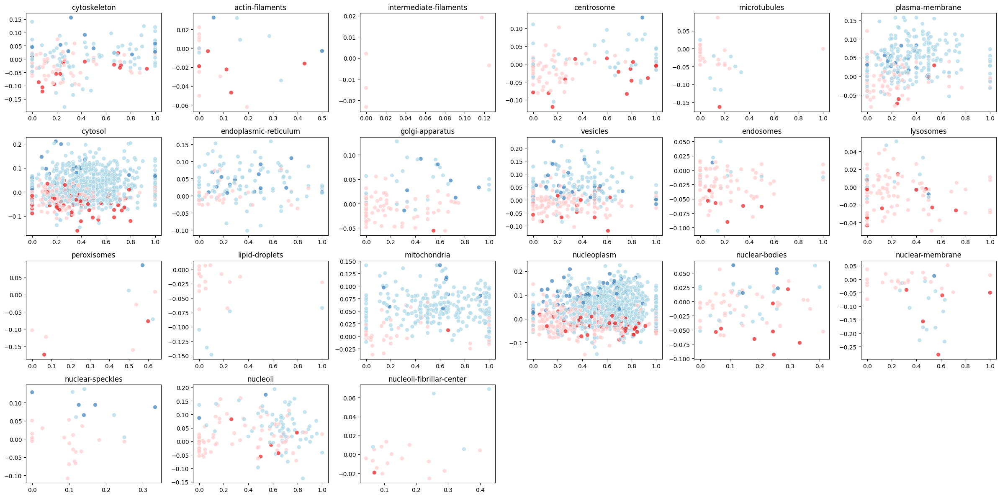

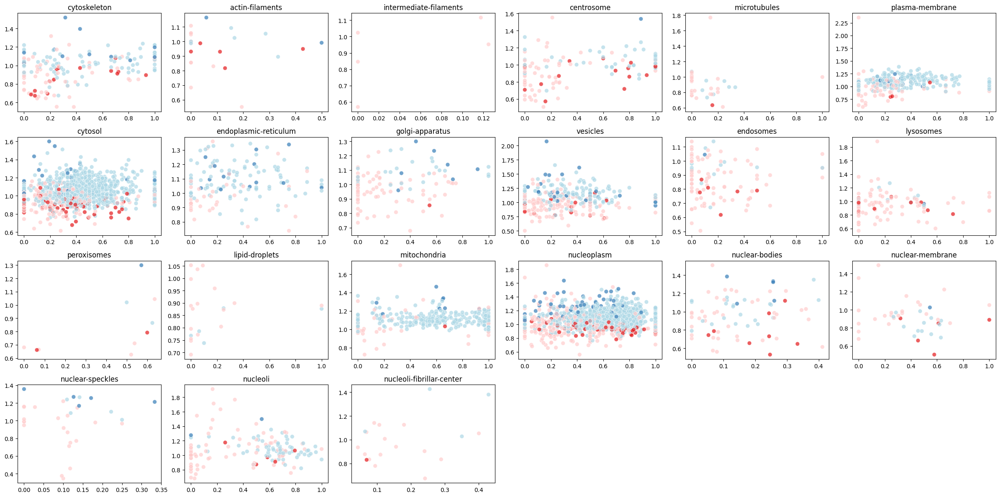

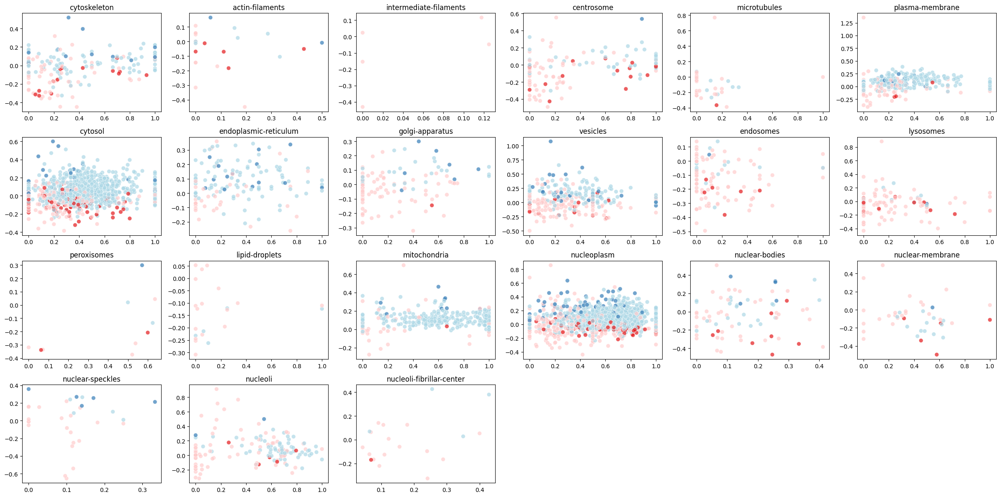

In [35]:
for y_label in ["activation_diff", "activation_ratio", "activation_percent_change"]:
    labels = scatter_data['label'].unique()
    n_labels = len(labels)
    n_cols = 6
    n_rows = int(np.ceil(n_labels / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*4, n_rows*3), sharex=False, sharey=False)
    legend_handles = None
    legend_labels = None
    for idx, label in enumerate(labels):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col]
        scatter = sns.scatterplot(
            data=scatter_data[scatter_data['label'] == label],
            x='frac_interactors',
            y=y_label,
            hue='predtype_change',
            palette=transition_palette,
            ax=ax,
            alpha=0.7,
            s=50,
            legend=False
        )
        ax.set_title(label)
        ax.set_xlabel("")
        ax.set_ylabel("")
        if idx == 0:
            # Get handles and labels for legend from the first plot
            scatter_legend = scatter.legend_
            if scatter_legend is not None:
                legend_handles, legend_labels = scatter_legend.legendHandles, [t.get_text() for t in scatter_legend.texts]

    # Remove unused subplots
    for idx in range(n_labels, n_rows*n_cols):
        fig.delaxes(axes.flatten()[idx])

    # Place legend outside the figure (use handles/labels from the first subplot)
    if legend_handles is not None and legend_labels is not None:
        fig.legend(
            legend_handles, legend_labels,
            title='Prediction Type Change',
            bbox_to_anchor=(1.05, 0.5),
            loc='center left'
        )

    plt.tight_layout()
    plt.show()